In [2]:
import pandas as pd

In [6]:
df_acc = pd.read_csv('datasets/EntryAccessoAmministrati_202501.csv')
df_stip = pd.read_csv('datasets/EntryAccreditoStipendi_202501.csv')
df_redd = pd.read_csv('datasets/EntryAmministratiPerFasciaDiReddito_202501.csv')
df_pend = pd.read_csv('datasets/EntryPendolarismo_202501.csv')


# ACCESSO AMMINISTRATI

In [25]:
df_acc.head()

,regione_residenza_domicilio,amministrazione_appartenenza,sesso,eta_max,eta_min,modalita_autenticazione,numero_occorrenze
0,ABRUZZO,A.O. S. GIOVANNI ADDOLORATA,F,34,25,SPID,2
1,ABRUZZO,A.O. S. GIOVANNI ADDOLORATA,M,34,25,SPID,3
2,ABRUZZO,A.O.R.N. ANTONIO CARDARELLI,M,44,35,SPID,3
3,ABRUZZO,A.O.R.N. ANTONIO CARDARELLI,M,54,45,SPID,2
4,ABRUZZO,AGENZIA DEL DEMANIO,F,44,35,SPID,3


In [26]:
#info 
df_acc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8528 entries, 0 to 8527
Data columns (total 7 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   regione_residenza_domicilio   8528 non-null   object
 1   amministrazione_appartenenza  8528 non-null   object
 2   sesso                         8528 non-null   object
 3   eta_max                       8528 non-null   object
 4   eta_min                       8528 non-null   int64 
 5   modalita_autenticazione       8528 non-null   object
 6   numero_occorrenze             8528 non-null   int64 
dtypes: int64(2), object(5)
memory usage: 466.5+ KB


In [27]:
#valori unici per ogni colonna di acc
unique_values_acc = {col: df_acc[col].unique() for col in df_acc.columns}
print("Unique values in df_acc:")
for col, values in unique_values_acc.items():
    print(f"{col}: {values}")

Unique values in df_acc:
regione_residenza_domicilio: ['ABRUZZO' 'BASILICATA' 'CALABRIA' 'CAMPANIA' 'EMILIA ROMAGNA' 'ESTERO'
 'FRIULI-VENEZIA GIULIA' 'LAZIO' 'LIGURIA' 'LOMBARDIA' 'MARCHE' 'MOLISE'
 'PIEMONTE' 'PUGLIA' 'SARDEGNA' 'SICILIA' 'TOSCANA' 'TRENTINO ALTO ADIGE'
 'UMBRIA' "VALLE D'AOSTA" 'VENETO']
amministrazione_appartenenza: ['A.O. S. GIOVANNI ADDOLORATA' 'A.O.R.N. ANTONIO CARDARELLI'
 'AGENZIA DEL DEMANIO' 'AGENZIA DELLE DOGANE' 'AGENZIA DELLE ENTRATE'
 'ANSFISA - AGENZIA NAZIONALE PER LA SICUREZZA DELLE FERROVIE E DELLE INFRASTRUTTURE STRADALI E AUTOSTRADALI'
 'AVVOCATURA GENERALE DELLO STATO'
 'AZIENDA OSPEDALIERA SAN CAMILLO FORLANINI'
 'AZIENDA REGIONALE EMERGENZA SANITARIA'
 'AZIENDA SANITARIA LOCALE VITERBO' 'AZIENDA SANITARIA LOCALE ROMA 2'
 'AZIENDA SANITARIA LOCALE LATINA' 'AZIENDA SANITARIA LOCALE ROMA 5'
 'AZIENDA SANITARIA LOCALE ROMA 3' 'AZIENDA SANITARIA LOCALE RIETI'
 'AZIENDA SANITARIA LOCALE ROMA 4' 'AZIENDA SANITARIA LOCALE ROMA 6'
 'CONSIGLIO DI STATO E 

In [29]:
#eta max in int togliendo ' ' in 100 
df_acc['eta_max'] = df_acc['eta_max'].str.replace(' ', '100').astype(int)


In [30]:
#info 
df_acc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8528 entries, 0 to 8527
Data columns (total 7 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   regione_residenza_domicilio   8528 non-null   object
 1   amministrazione_appartenenza  8528 non-null   object
 2   sesso                         8528 non-null   object
 3   eta_max                       8528 non-null   int64 
 4   eta_min                       8528 non-null   int64 
 5   modalita_autenticazione       8528 non-null   object
 6   numero_occorrenze             8528 non-null   int64 
dtypes: int64(3), object(4)
memory usage: 466.5+ KB


In [38]:
# Check for missing values and data types
missing_values_acc = df_acc.isnull().sum()
data_types_acc = df_acc.info()



# Show the results
missing_values_acc, data_types_acc, 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8528 entries, 0 to 8527
Data columns (total 7 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   regione_residenza_domicilio   8528 non-null   object
 1   amministrazione_appartenenza  8528 non-null   object
 2   sesso                         8528 non-null   object
 3   eta_max                       8528 non-null   int64 
 4   eta_min                       8528 non-null   int64 
 5   modalita_autenticazione       8528 non-null   object
 6   numero_occorrenze             8528 non-null   int64 
dtypes: int64(3), object(4)
memory usage: 466.5+ KB


(regione_residenza_domicilio     0
 amministrazione_appartenenza    0
 sesso                           0
 eta_max                         0
 eta_min                         0
 modalita_autenticazione         0
 numero_occorrenze               0
 dtype: int64,
 None)

In [39]:
# Let's create a table showing the unique values for each column
unique_values_acc = {col: df_acc[col].unique() for col in df_acc.columns}

# Convert to a DataFrame to display it
unique_values_df_acc = pd.DataFrame({col: [', '.join(map(str, values))] for col, values in unique_values_acc.items()}).transpose()

# Display the unique values DataFrame
print(unique_values_df_acc)

                                                                              0
regione_residenza_domicilio   ABRUZZO, BASILICATA, CALABRIA, CAMPANIA, EMILI...
amministrazione_appartenenza  A.O. S. GIOVANNI ADDOLORATA, A.O.R.N. ANTONIO ...
sesso                                                                      F, M
eta_max                                                 34, 44, 54, 64, 100, 24
eta_min                                                  25, 35, 45, 55, 65, 18
modalita_autenticazione                              SPID, CIE, CNS, FEDERATION
numero_occorrenze             2, 3, 10, 8, 9, 6, 5, 7, 19, 18, 31, 22, 17, 3...


In [41]:
# ANALISI STATISTICA 

# Statistiche descrittive per le variabili numeriche
numerical_stats_acc = df_acc[['eta_min', 'eta_max', 'numero_occorrenze']].describe().round(2)

# Frequenze per le variabili categoriali
categorical_stats_acc = df_acc[['sesso', 'regione_residenza_domicilio', 'amministrazione_appartenenza', 'modalita_autenticazione']].describe().round(2)

# Mostriamo i risultati
numerical_stats_acc


,eta_min,eta_max,numero_occorrenze
count,8528.00,8528.00,8528.00
mean,42.99,54.87,177.80
std,13.88,20.17,1124.43
min,18.00,24.00,2.00
25%,35.00,44.00,3.00
50%,45.00,54.00,9.00
75%,55.00,64.00,42.00
max,65.00,100.00,29526.00


In [42]:
categorical_stats_acc

,sesso,regione_residenza_domicilio,amministrazione_appartenenza,modalita_autenticazione
count,8528,8528,8528,8528
unique,2,21,81,4
top,M,LAZIO,MINISTERO DELLA DIFESA,SPID
freq,4578,1256,1015,4989


In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

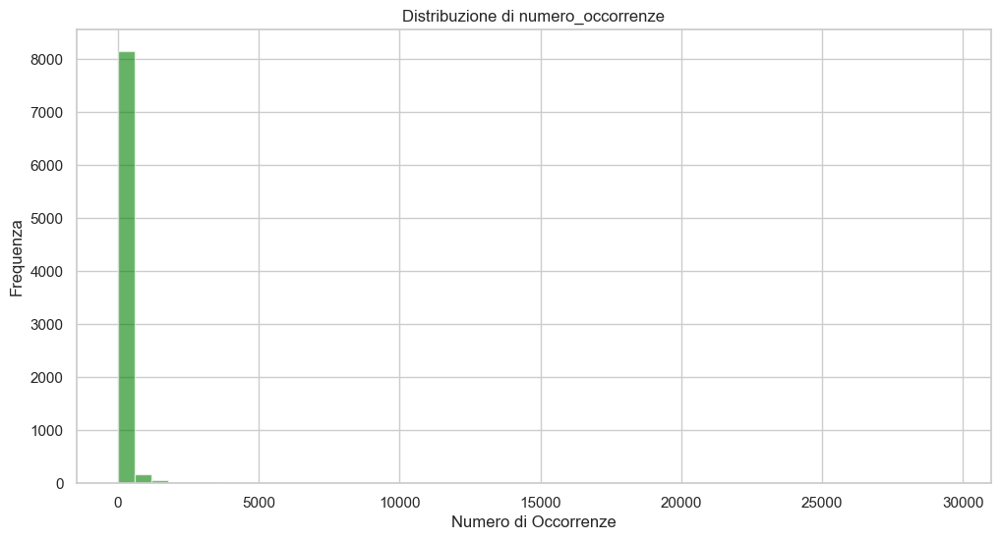

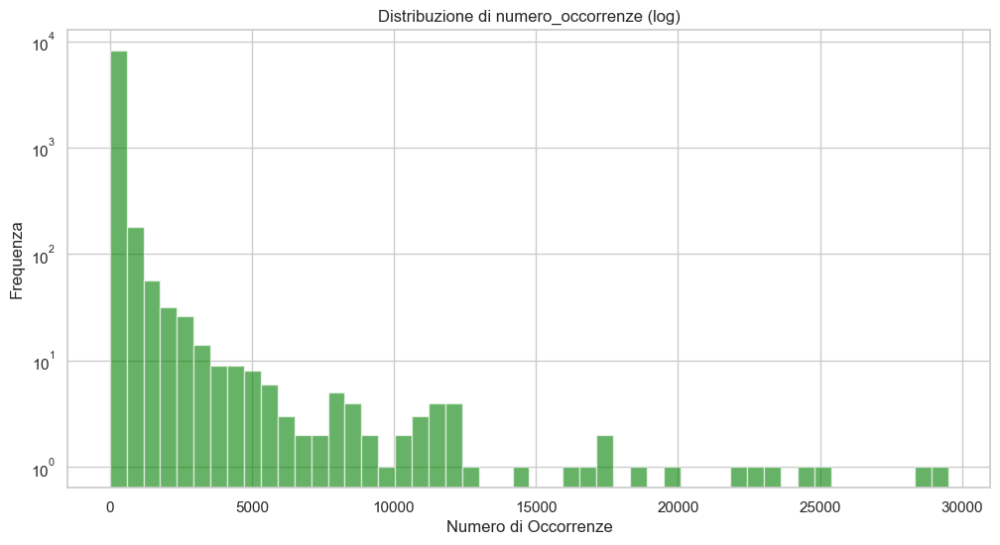

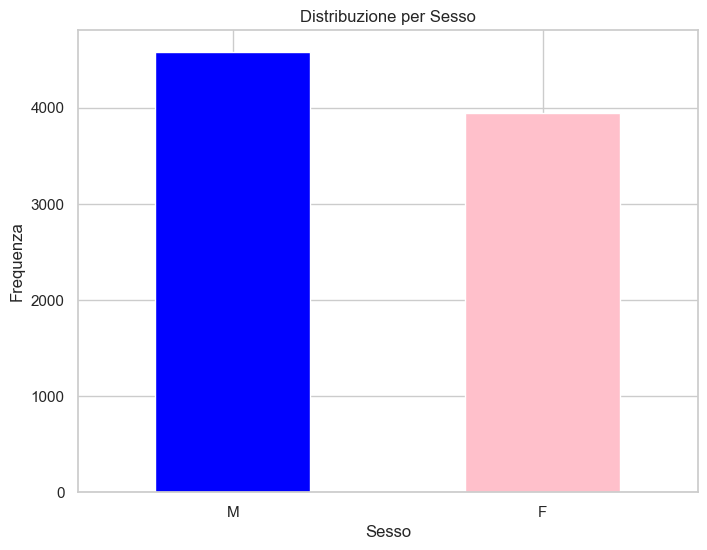

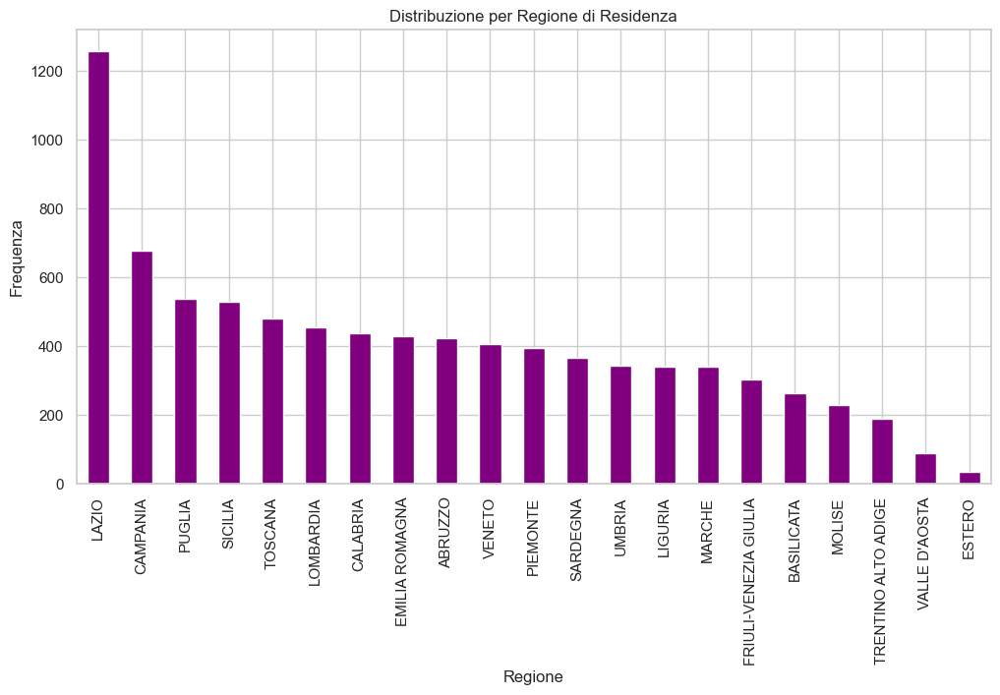

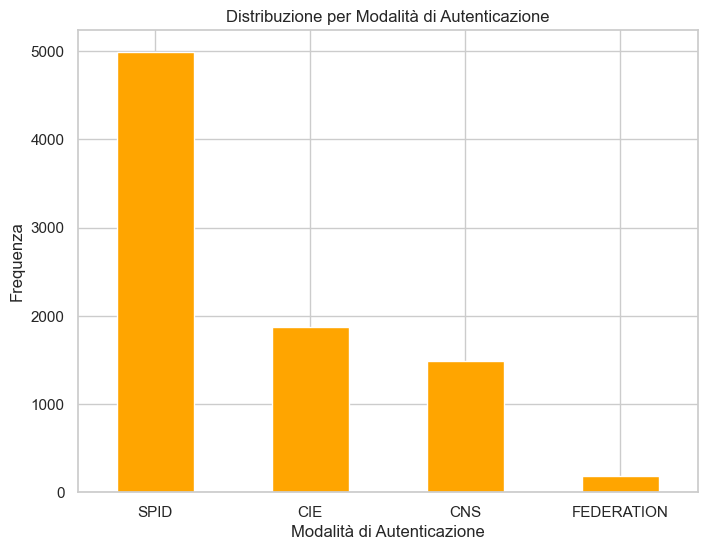

In [45]:
# Impostiamo il tema di Seaborn per i grafici
sns.set_theme(style="whitegrid")



# 2. Visualizzazione della distribuzione di numero_occorrenze
plt.figure(figsize=(12, 6))
plt.hist(df_acc['numero_occorrenze'], bins=50, alpha=0.6, color='green')
plt.title('Distribuzione di numero_occorrenze')
plt.xlabel('Numero di Occorrenze')
plt.ylabel('Frequenza')
plt.show()

# 2. Visualizzazione della distribuzione di numero_occorrenze
plt.figure(figsize=(12, 6))
plt.hist(df_acc['numero_occorrenze'], bins=50, alpha=0.6, color='green',log=True)
plt.title('Distribuzione di numero_occorrenze (log)')
plt.xlabel('Numero di Occorrenze')
plt.ylabel('Frequenza')
plt.show()

# 3. Distribuzione delle variabili categoriali
# 3a. Sesso
plt.figure(figsize=(8, 6))
df_acc['sesso'].value_counts().plot(kind='bar', color=['blue', 'pink'])
plt.title('Distribuzione per Sesso')
plt.xlabel('Sesso')
plt.ylabel('Frequenza')
plt.xticks(rotation=0)
plt.show()

# 3b. Regione di residenza
plt.figure(figsize=(12, 6))
df_acc['regione_residenza_domicilio'].value_counts().plot(kind='bar', color='purple')
plt.title('Distribuzione per Regione di Residenza')
plt.xlabel('Regione')
plt.ylabel('Frequenza')
plt.xticks(rotation=90)
plt.show()

# 3c. Modalità di Autenticazione
plt.figure(figsize=(8, 6))
df_acc['modalita_autenticazione'].value_counts().plot(kind='bar', color='orange')
plt.title('Distribuzione per Modalità di Autenticazione')
plt.xlabel('Modalità di Autenticazione')
plt.ylabel('Frequenza')
plt.xticks(rotation=0)
plt.show()


/var/folders/zp/cf7h_5md0811x61mf22_rk8r0000gn/T/ipykernel_52887/2930320959.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='eta_min', y='numero_occorrenze', data=df_acc, palette='viridis')


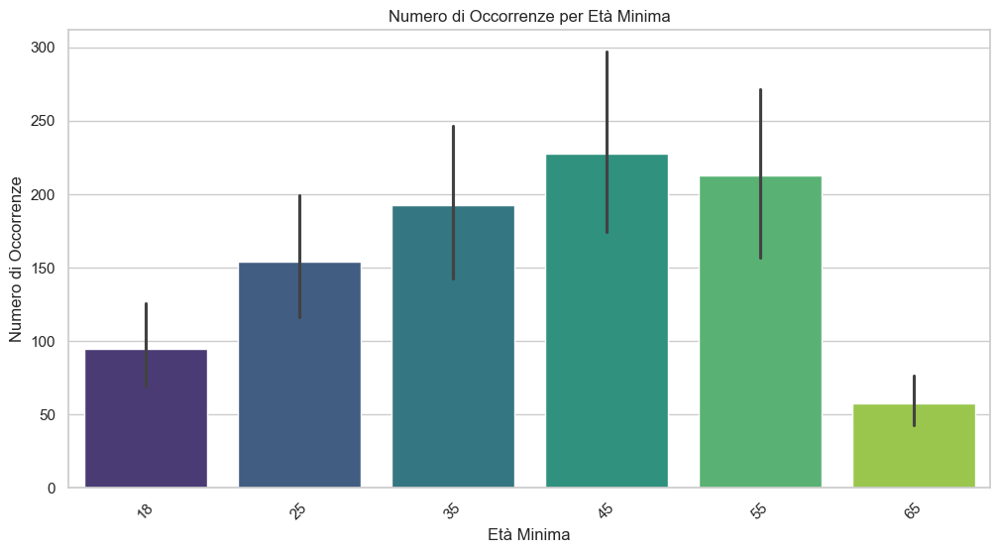

/var/folders/zp/cf7h_5md0811x61mf22_rk8r0000gn/T/ipykernel_52887/2930320959.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='eta_max', y='numero_occorrenze', data=df_acc, palette='viridis')


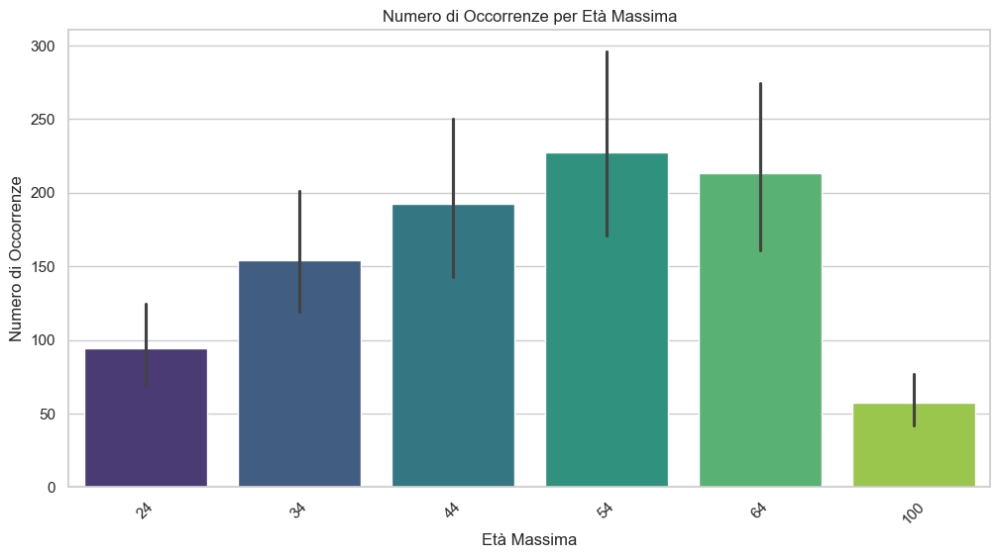

In [63]:
#barplot eta min e emax 
plt.figure(figsize=(12, 6))
sns.barplot(x='eta_min', y='numero_occorrenze', data=df_acc, palette='viridis')
plt.title('Numero di Occorrenze per Età Minima')
plt.xlabel('Età Minima')
plt.ylabel('Numero di Occorrenze')
plt.xticks(rotation=45)
plt.show()
#barplot eta min e emax
plt.figure(figsize=(12, 6))
sns.barplot(x='eta_max', y='numero_occorrenze', data=df_acc, palette='viridis')
plt.title('Numero di Occorrenze per Età Massima')
plt.xlabel('Età Massima')
plt.ylabel('Numero di Occorrenze')
plt.xticks(rotation=45)
plt.show()

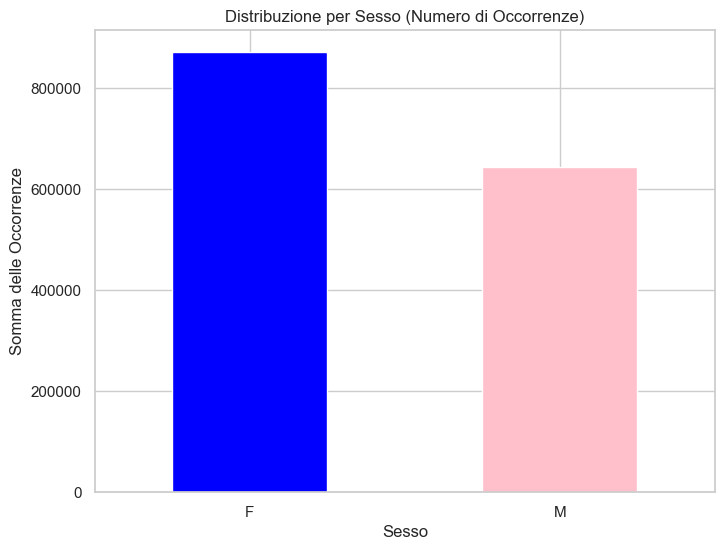

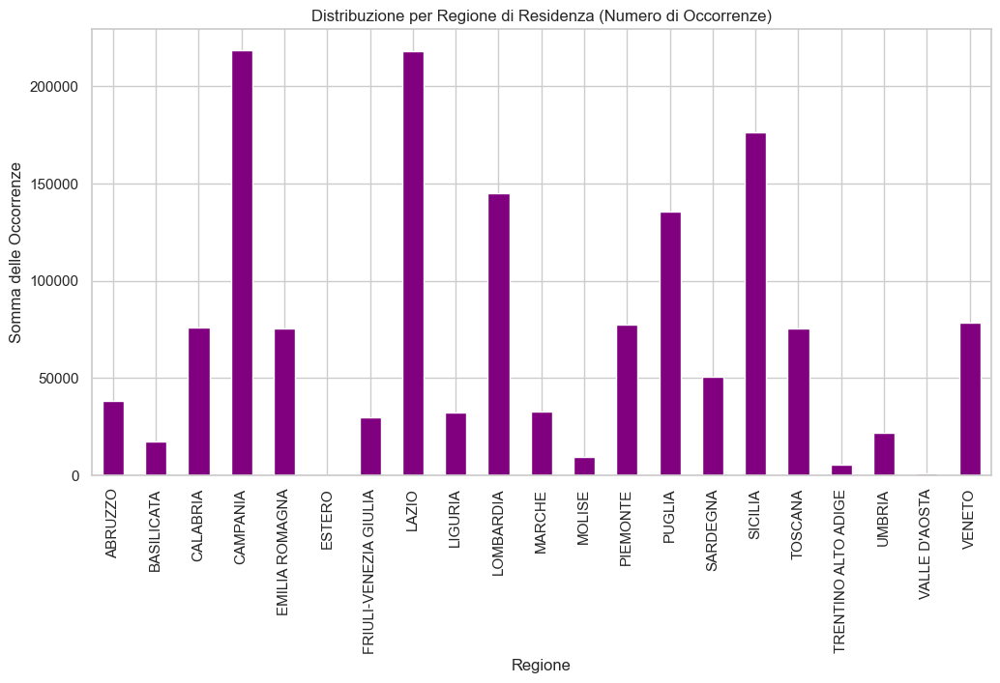

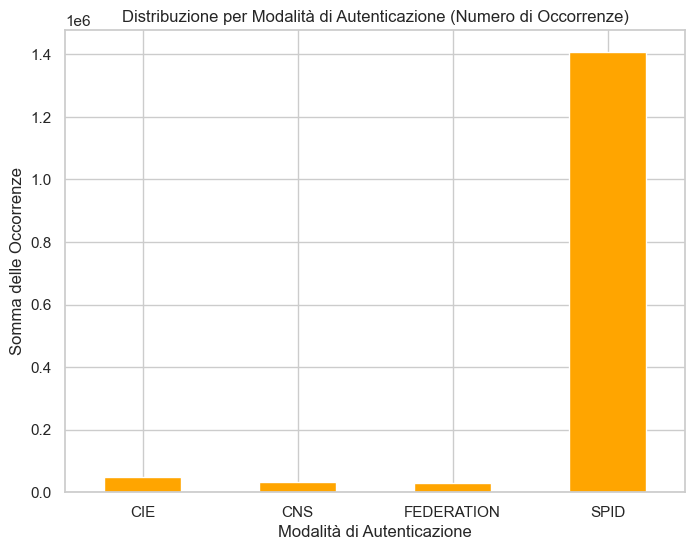

In [48]:
# 3a. Distribuzione per sesso (somma di 'numero_occorrenze')
sex_occurrences = df_acc.groupby('sesso')['numero_occorrenze'].sum()
plt.figure(figsize=(8, 6))
sex_occurrences.plot(kind='bar', color=['blue', 'pink'])
plt.title('Distribuzione per Sesso (Numero di Occorrenze)')
plt.xlabel('Sesso')
plt.ylabel('Somma delle Occorrenze')
plt.xticks(rotation=0)
plt.show()

# 3b. Distribuzione per regione di residenza (somma di 'numero_occorrenze')
region_occurrences = df_acc.groupby('regione_residenza_domicilio')['numero_occorrenze'].sum()
plt.figure(figsize=(12, 6))
region_occurrences.plot(kind='bar', color='purple')
plt.title('Distribuzione per Regione di Residenza (Numero di Occorrenze)')
plt.xlabel('Regione')
plt.ylabel('Somma delle Occorrenze')
plt.xticks(rotation=90)
plt.show()

# 3c. Distribuzione per modalità di autenticazione (somma di 'numero_occorrenze')
auth_occurrences = df_acc.groupby('modalita_autenticazione')['numero_occorrenze'].sum()
plt.figure(figsize=(8, 6))
auth_occurrences.plot(kind='bar', color='orange')
plt.title('Distribuzione per Modalità di Autenticazione (Numero di Occorrenze)')
plt.xlabel('Modalità di Autenticazione')
plt.ylabel('Somma delle Occorrenze')
plt.xticks(rotation=0)
plt.show()


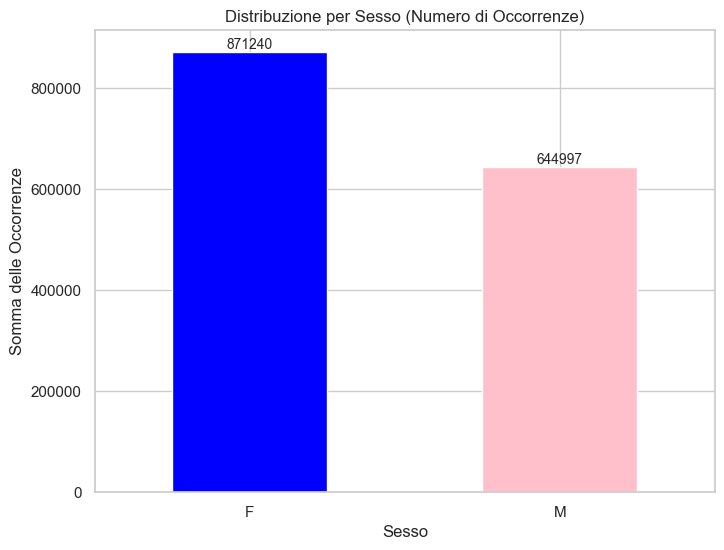

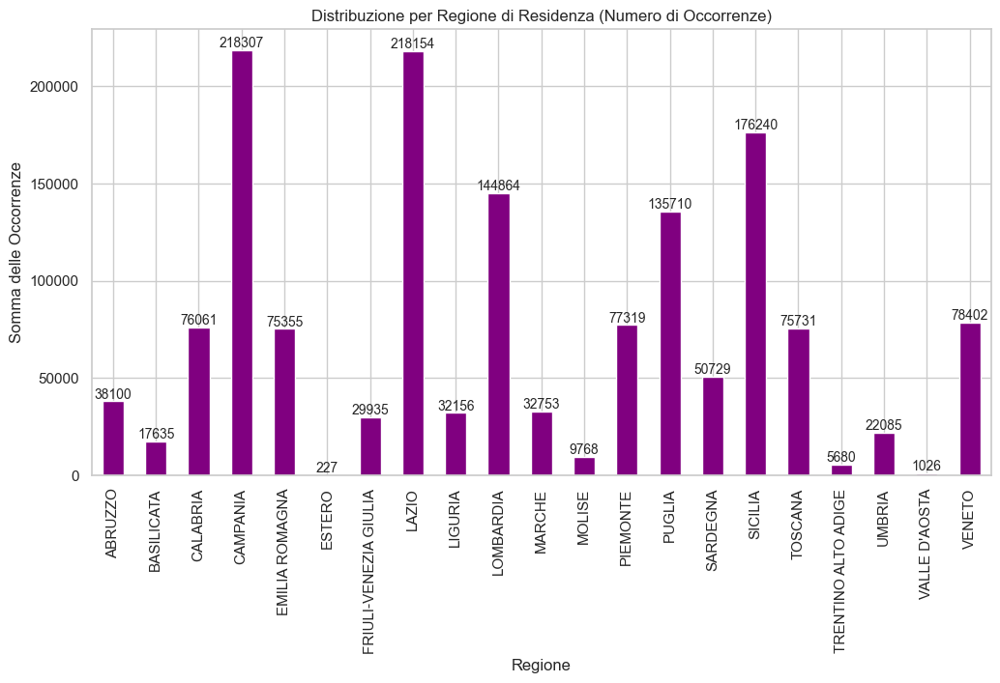

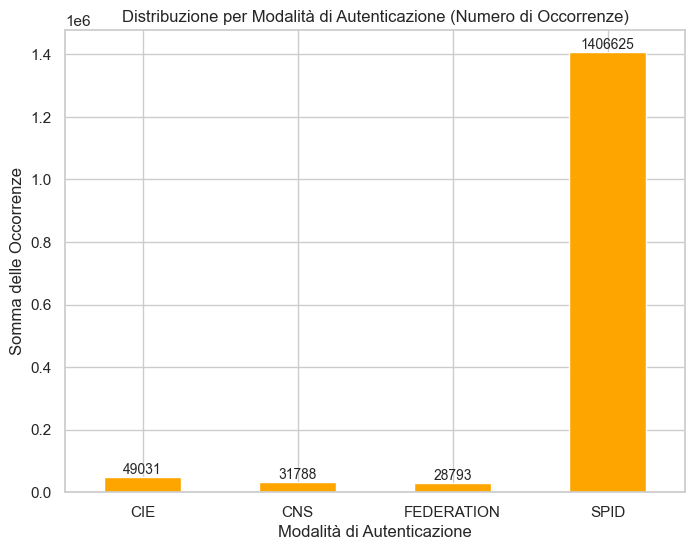

In [49]:
def plot_bar_with_values(data, title, xlabel, ylabel, colors, rotation=0, figsize=(8,6)):
    plt.figure(figsize=figsize)
    ax = data.plot(kind='bar', color=colors)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=rotation)
    
    # Aggiungere i numeri in cima alle barre
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{int(height)}', (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=10)
    plt.show()

# 3a. Distribuzione per sesso con numeri
plot_bar_with_values(sex_occurrences, 'Distribuzione per Sesso (Numero di Occorrenze)', 'Sesso', 'Somma delle Occorrenze', ['blue', 'pink'], rotation=0)

# 3b. Distribuzione per regione di residenza con numeri
plot_bar_with_values(region_occurrences, 'Distribuzione per Regione di Residenza (Numero di Occorrenze)', 'Regione', 'Somma delle Occorrenze', 'purple', rotation=90, figsize=(12,6))

# 3c. Distribuzione per modalità di autenticazione con numeri
plot_bar_with_values(auth_occurrences, 'Distribuzione per Modalità di Autenticazione (Numero di Occorrenze)', 'Modalità di Autenticazione', 'Somma delle Occorrenze', 'orange', rotation=0)


In [16]:
# Calcoliamo la somma del numero di occorrenze per ogni modalità di autenticazione
modalita_occorrenze_somma = df_acc.groupby('modalita_autenticazione')['numero_occorrenze'].sum().reset_index()


# Mostriamo il risultato
modalita_occorrenze_somma



,modalita_autenticazione,numero_occorrenze
0,CIE,49031
1,CNS,31788
2,FEDERATION,28793
3,SPID,1406625


In [51]:
# Calcoliamo la somma del numero di occorrenze per ogni modalità di autenticazione e per ogni regione
regioni_modalita_occorrenze_somma = df_acc.groupby(['regione_residenza_domicilio', 'modalita_autenticazione'])['numero_occorrenze'].sum().reset_index()


print(regioni_modalita_occorrenze_somma.to_string())

   regione_residenza_domicilio modalita_autenticazione  numero_occorrenze
0                      ABRUZZO                     CIE               1250
1                      ABRUZZO                     CNS                570
2                      ABRUZZO              FEDERATION                707
3                      ABRUZZO                    SPID              35573
4                   BASILICATA                     CIE                383
5                   BASILICATA                     CNS                193
6                   BASILICATA              FEDERATION                336
7                   BASILICATA                    SPID              16723
8                     CALABRIA                     CIE               2047
9                     CALABRIA                     CNS                774
10                    CALABRIA              FEDERATION               1400
11                    CALABRIA                    SPID              71840
12                    CAMPANIA        

In [18]:
sesso_modalita_occorrenze_somma = df_acc.groupby(['sesso', 'modalita_autenticazione'])['numero_occorrenze'].sum().reset_index()
print(sesso_modalita_occorrenze_somma)

  sesso modalita_autenticazione  numero_occorrenze
0     F                     CIE              24420
1     F                     CNS               9231
2     F              FEDERATION              23115
3     F                    SPID             814474
4     M                     CIE              24611
5     M                     CNS              22557
6     M              FEDERATION               5678
7     M                    SPID             592151


In [54]:
#occorrenze per sesso e regione e modalità di autenticazione
sesso_regioni_modalita_occorrenze_somma = df_acc.groupby(['sesso', 'regione_residenza_domicilio', 'modalita_autenticazione'])['numero_occorrenze'].sum().reset_index()
print(sesso_regioni_modalita_occorrenze_somma.to_string())

    sesso regione_residenza_domicilio modalita_autenticazione  numero_occorrenze
0       F                     ABRUZZO                     CIE                659
1       F                     ABRUZZO                     CNS                222
2       F                     ABRUZZO              FEDERATION                594
3       F                     ABRUZZO                    SPID              21566
4       F                  BASILICATA                     CIE                206
5       F                  BASILICATA                     CNS                 67
6       F                  BASILICATA              FEDERATION                269
7       F                  BASILICATA                    SPID               9998
8       F                    CALABRIA                     CIE                963
9       F                    CALABRIA                     CNS                297
10      F                    CALABRIA              FEDERATION                921
11      F                   

In [4]:
# Crea la colonna 'range_eta' come 'eta_min-eta_max'
df_acc['range_eta'] = df_acc.apply(lambda row: f"{row['eta_min']}-{row['eta_max']}", axis=1)

In [68]:
#range 
#unique values 
print("Unique values in df_acc:")
print(df_acc['range_eta'].unique())

Unique values in df_acc:
['25-34' '35-44' '45-54' '55-64' '65-100' '18-24']


  range_eta  numero_occorrenze
0     18-24              45137
1     25-34             214776
2     35-44             323128
3     45-54             440544
4     55-64             435088
5    65-100              57564


/var/folders/zp/cf7h_5md0811x61mf22_rk8r0000gn/T/ipykernel_52887/816620270.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='range_eta', y='numero_occorrenze', data=range_eta_occurrences, palette='viridis')


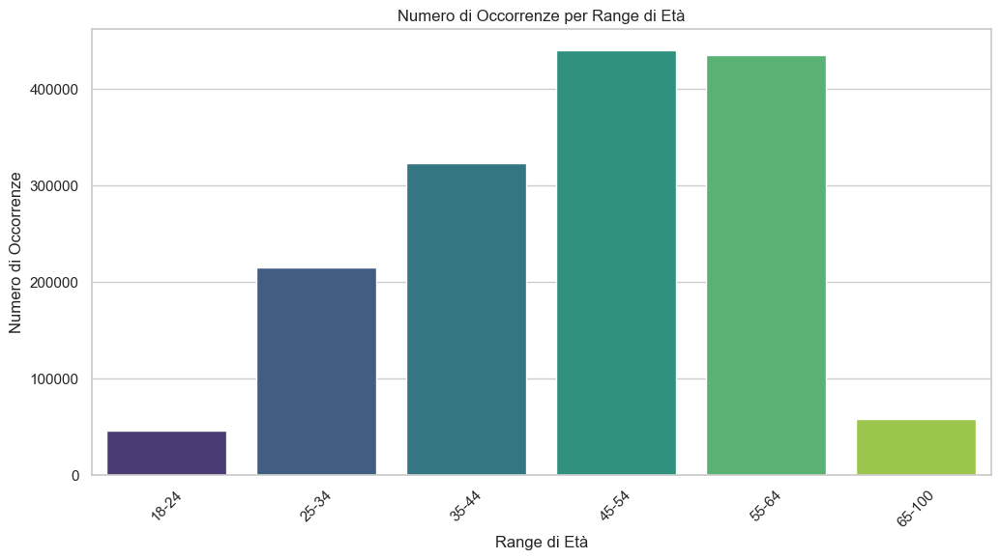

In [72]:
#num occorrenze per range eta
range_eta_occurrences = df_acc.groupby('range_eta')['numero_occorrenze'].sum().reset_index()
print(range_eta_occurrences)
#barplot con num occorrenze per range eta
plt.figure(figsize=(12, 6))
sns.barplot(x='range_eta', y='numero_occorrenze', data=range_eta_occurrences, palette='viridis')
plt.title('Numero di Occorrenze per Range di Età')
plt.xlabel('Range di Età')  
plt.ylabel('Numero di Occorrenze')
plt.xticks(rotation=45)
plt.show()

In [5]:
#num occorrenze per range eta
range_eta_occurrences = df_acc.groupby(['range_eta','modalita_autenticazione'])['numero_occorrenze'].sum().reset_index()
print(range_eta_occurrences)

   range_eta modalita_autenticazione  numero_occorrenze
0      18-24                     CIE               1898
1      18-24                     CNS                100
2      18-24              FEDERATION                  2
3      18-24                    SPID              43137
4      25-34                     CIE               4741
5      25-34                     CNS               1093
6      25-34              FEDERATION               1048
7      25-34                    SPID             207894
8      35-44                     CIE               7919
9      35-44                     CNS               5297
10     35-44              FEDERATION               3501
11     35-44                    SPID             306411
12     45-54                     CIE              13822
13     45-54                     CNS              11772
14     45-54              FEDERATION               6838
15     45-54                    SPID             408112
16     55-64                     CIE            

In [70]:
#num occorrenze per range eta e sesso e regione 
range_eta_sesso_regioni_occurrences = df_acc.groupby(['range_eta', 'sesso', 'regione_residenza_domicilio'])['numero_occorrenze'].sum().reset_index()
print(range_eta_sesso_regioni_occurrences.to_string())



    range_eta sesso regione_residenza_domicilio  numero_occorrenze
0       18-24     F                     ABRUZZO                369
1       18-24     F                  BASILICATA                124
2       18-24     F                    CALABRIA                686
3       18-24     F                    CAMPANIA               2634
4       18-24     F              EMILIA ROMAGNA                717
5       18-24     F       FRIULI-VENEZIA GIULIA                303
6       18-24     F                       LAZIO               1308
7       18-24     F                     LIGURIA                278
8       18-24     F                   LOMBARDIA               1924
9       18-24     F                      MARCHE                292
10      18-24     F                      MOLISE                 91
11      18-24     F                    PIEMONTE                926
12      18-24     F                      PUGLIA               1754
13      18-24     F                    SARDEGNA               

In [71]:
#num occorrenze per range eta e sesso e modalità di autenticazione
range_eta_sesso_modalita_occurrences = df_acc.groupby(['range_eta', 'sesso', 'modalita_autenticazione'])['numero_occorrenze'].sum().reset_index()
print(range_eta_sesso_modalita_occurrences.to_string())


   range_eta sesso modalita_autenticazione  numero_occorrenze
0      18-24     F                     CIE                721
1      18-24     F                     CNS                 21
2      18-24     F                    SPID              14649
3      18-24     M                     CIE               1177
4      18-24     M                     CNS                 79
5      18-24     M              FEDERATION                  2
6      18-24     M                    SPID              28488
7      25-34     F                     CIE               2171
8      25-34     F                     CNS                366
9      25-34     F              FEDERATION                724
10     25-34     F                    SPID             113846
11     25-34     M                     CIE               2570
12     25-34     M                     CNS                727
13     25-34     M              FEDERATION                324
14     25-34     M                    SPID              94048
15     3

In [76]:
df_acc.head()

,regione_residenza_domicilio,amministrazione_appartenenza,sesso,eta_max,eta_min,modalita_autenticazione,numero_occorrenze
0,ABRUZZO,A.O. S. GIOVANNI ADDOLORATA,F,34,25,SPID,2
1,ABRUZZO,A.O. S. GIOVANNI ADDOLORATA,M,34,25,SPID,3
2,ABRUZZO,A.O.R.N. ANTONIO CARDARELLI,M,44,35,SPID,3
3,ABRUZZO,A.O.R.N. ANTONIO CARDARELLI,M,54,45,SPID,2
4,ABRUZZO,AGENZIA DEL DEMANIO,F,44,35,SPID,3


In [75]:
#remove range 
df_acc.drop(columns=['range_eta'], inplace=True)

In [78]:
#salva 
df_acc.to_csv('datasets/EntryAccessoAmministrati_202501_clean.csv', index=False)

# STIPENDI

In [93]:
df_stip.shape

(25580, 8)

In [79]:
df_stip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25580 entries, 0 to 25579
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   comune_della_sede   25580 non-null  object
 1   amministrazione     25580 non-null  object
 2   eta_min             25580 non-null  int64 
 3   eta_max             25580 non-null  object
 4   sesso               25580 non-null  object
 5   modalita_pagamento  25580 non-null  object
 6   numero              25580 non-null  int64 
 7   range_eta           25580 non-null  object
dtypes: int64(2), object(6)
memory usage: 1.6+ MB


In [80]:
#valori unici eta max 
unique_values_stip = {col: df_stip[col].unique() for col in df_stip.columns}
# Convert to a DataFrame to display it
unique_values_df_stip = pd.DataFrame({col: [', '.join(map(str, values))] for col, values in unique_values_stip.items()}).transpose()
# Display the unique values DataFrame
print(unique_values_df_stip)


                                                                    0
comune_della_sede   ABANO TERME, ABBADIA SAN SALVATORE, ABBASANTA,...
amministrazione     MINISTERO DELL'ISTRUZIONE E DEL MERITO, MINIST...
eta_min                                        25, 35, 45, 55, 65, 18
eta_max                                         34, 44, 54, 64,  , 24
sesso                                                            F, M
modalita_pagamento  Conto corrente/Carta conto, Libretto postale, ...
numero              31, 18, 56, 115, 136, 36, 8, 23, 7, 16, 38, 44...
range_eta                     25-34, 35-44, 45-54, 55-64, 65- , 18-24


In [81]:
#sostituisci vuoto con 100 per eta max 
df_stip['eta_max'] = df_stip['eta_max'].replace(' ', 100)

In [82]:
#eta max come int
df_stip['eta_max'] = df_stip['eta_max'].astype(int)

In [83]:
df_stip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25580 entries, 0 to 25579
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   comune_della_sede   25580 non-null  object
 1   amministrazione     25580 non-null  object
 2   eta_min             25580 non-null  int64 
 3   eta_max             25580 non-null  int64 
 4   sesso               25580 non-null  object
 5   modalita_pagamento  25580 non-null  object
 6   numero              25580 non-null  int64 
 7   range_eta           25580 non-null  object
dtypes: int64(3), object(5)
memory usage: 1.6+ MB


In [19]:
print(df_stip.to_string())

                        comune_della_sede                                                                                             amministrazione  eta_min eta_max sesso          modalita_pagamento  numero
0                             ABANO TERME                                                                      MINISTERO DELL'ISTRUZIONE E DEL MERITO       25      34     F  Conto corrente/Carta conto      31
1                             ABANO TERME                                                                      MINISTERO DELL'ISTRUZIONE E DEL MERITO       25      34     M  Conto corrente/Carta conto      18
2                             ABANO TERME                                                                      MINISTERO DELL'ISTRUZIONE E DEL MERITO       35      44     F  Conto corrente/Carta conto      56
3                             ABANO TERME                                                                      MINISTERO DELL'ISTRUZIONE E DEL MERITO       35      

In [84]:
# Verifica la presenza di valori mancanti e visualizza i tipi di dati
missing_values_stip = df_stip.isnull().sum()
data_types_stip = df_stip.dtypes

# Statistiche descrittive per le variabili numeriche
numerical_summary_stip = df_stip.describe()

# Statistiche descrittive per le variabili categoriali
categorical_summary_stip = df_stip.describe(include=['object'])

missing_values_stip, data_types_stip, 


(comune_della_sede     0
 amministrazione       0
 eta_min               0
 eta_max               0
 sesso                 0
 modalita_pagamento    0
 numero                0
 range_eta             0
 dtype: int64,
 comune_della_sede     object
 amministrazione       object
 eta_min                int64
 eta_max                int64
 sesso                 object
 modalita_pagamento    object
 numero                 int64
 range_eta             object
 dtype: object)

In [85]:
numerical_summary_stip

,eta_min,eta_max,numero
count,25580.000000,25580.000000,25580.000000
mean,43.136083,54.342846,71.069273
std,12.787181,17.867784,595.019641
min,18.000000,24.000000,6.000000
25%,35.000000,44.000000,11.000000
50%,45.000000,54.000000,25.000000
75%,55.000000,64.000000,52.000000
max,65.000000,100.000000,58874.000000


In [86]:
categorical_summary_stip

,comune_della_sede,amministrazione,sesso,modalita_pagamento,range_eta
count,25580,25580,25580,25580,25580
unique,2891,63,2,3,6
top,ROMA,MINISTERO DELL'ISTRUZIONE E DEL MERITO,F,Conto corrente/Carta conto,55-64
freq,430,19255,15802,25104,6681


In [34]:
# Creiamo una nuova colonna 'range_eta' che contiene il range di eta
df_stip['range_eta'] = df_stip.apply(lambda row: f"{row['eta_min']}-{row['eta_max']}", axis=1) 

# Verifica la creazione della nuova colonna
df_stip[['eta_min', 'range_eta']].head()
# Verifica la presenza di valori nulli
print(df_stip.isnull().sum())

df_stip.head()

comune_della_sede     0
amministrazione       0
eta_min               0
eta_max               0
sesso                 0
modalita_pagamento    0
numero                0
range_eta             0
dtype: int64


,comune_della_sede,amministrazione,eta_min,eta_max,sesso,modalita_pagamento,numero,range_eta
0,ABANO TERME,MINISTERO DELL'ISTRUZIONE E DEL MERITO,25,34,F,Conto corrente/Carta conto,31,25-34
1,ABANO TERME,MINISTERO DELL'ISTRUZIONE E DEL MERITO,25,34,M,Conto corrente/Carta conto,18,25-34
2,ABANO TERME,MINISTERO DELL'ISTRUZIONE E DEL MERITO,35,44,F,Conto corrente/Carta conto,56,35-44
3,ABANO TERME,MINISTERO DELL'ISTRUZIONE E DEL MERITO,35,44,M,Conto corrente/Carta conto,18,35-44
4,ABANO TERME,MINISTERO DELL'ISTRUZIONE E DEL MERITO,45,54,F,Conto corrente/Carta conto,115,45-54


In [89]:
# Creiamo una tabella con i valori unici per ogni colonna
unique_values_stip = {col: df_stip[col].unique() for col in df_stip.columns}

# Convertiamo la tabella in un DataFrame per una visualizzazione migliore
unique_values_stip_df = pd.DataFrame({col: [', '.join(map(str, values))] for col, values in unique_values_stip.items()}).transpose()
# Mostriamo la tabella con i valori unici
print(unique_values_stip_df)

# Mostriamo i valori unici per la colonna 'modalita_pagamento'
print(unique_values_stip['modalita_pagamento'])

                                                                    0
comune_della_sede   ABANO TERME, ABBADIA SAN SALVATORE, ABBASANTA,...
amministrazione     MINISTERO DELL'ISTRUZIONE E DEL MERITO, MINIST...
eta_min                                        25, 35, 45, 55, 65, 18
eta_max                                       34, 44, 54, 64, 100, 24
sesso                                                            F, M
modalita_pagamento  Conto corrente/Carta conto, Libretto postale, ...
numero              31, 18, 56, 115, 136, 36, 8, 23, 7, 16, 38, 44...
range_eta                   25-34, 35-44, 45-54, 55-64, 65-100, 18-24
['Conto corrente/Carta conto' 'Libretto postale' 'Contanti']


In [90]:
# Statistiche descrittive per le variabili numeriche
numerical_stats_stip = df_stip[['eta_min', 'eta_max', 'numero', 'range_eta']].describe()

# Frequenze per le variabili categoriali
categorical_stats_stip = df_stip[['sesso', 'comune_della_sede', 'amministrazione', 'modalita_pagamento']].describe()

numerical_stats_stip


,eta_min,eta_max,numero
count,25580.000000,25580.000000,25580.000000
mean,43.136083,54.342846,71.069273
std,12.787181,17.867784,595.019641
min,18.000000,24.000000,6.000000
25%,35.000000,44.000000,11.000000
50%,45.000000,54.000000,25.000000
75%,55.000000,64.000000,52.000000
max,65.000000,100.000000,58874.000000


In [91]:
categorical_stats_stip

,sesso,comune_della_sede,amministrazione,modalita_pagamento
count,25580,25580,25580,25580
unique,2,2891,63,3
top,F,ROMA,MINISTERO DELL'ISTRUZIONE E DEL MERITO,Conto corrente/Carta conto
freq,15802,430,19255,25104


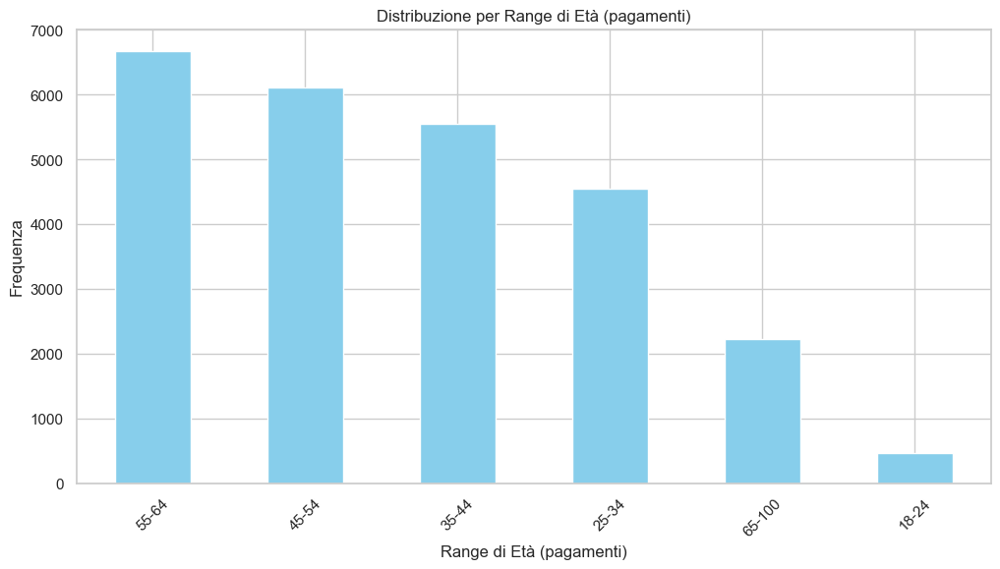

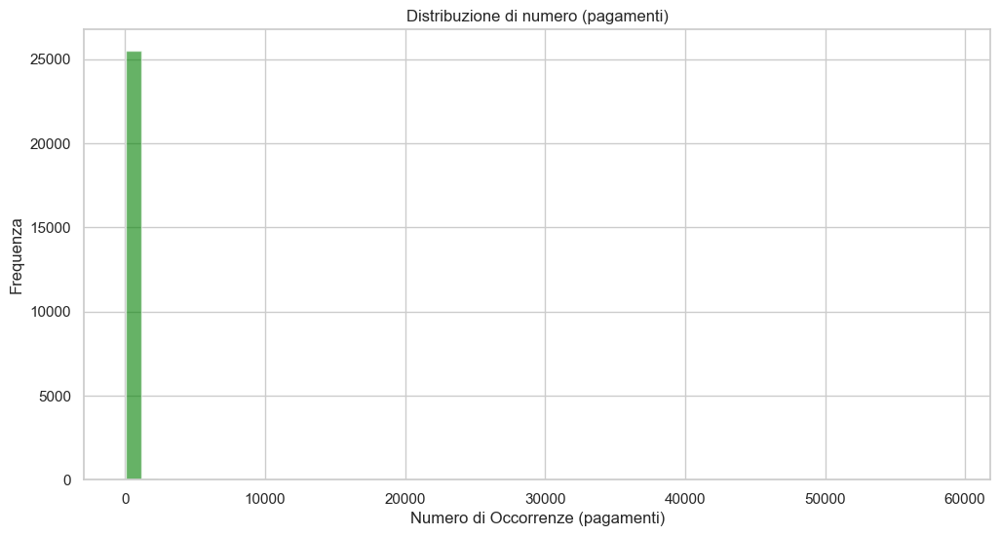

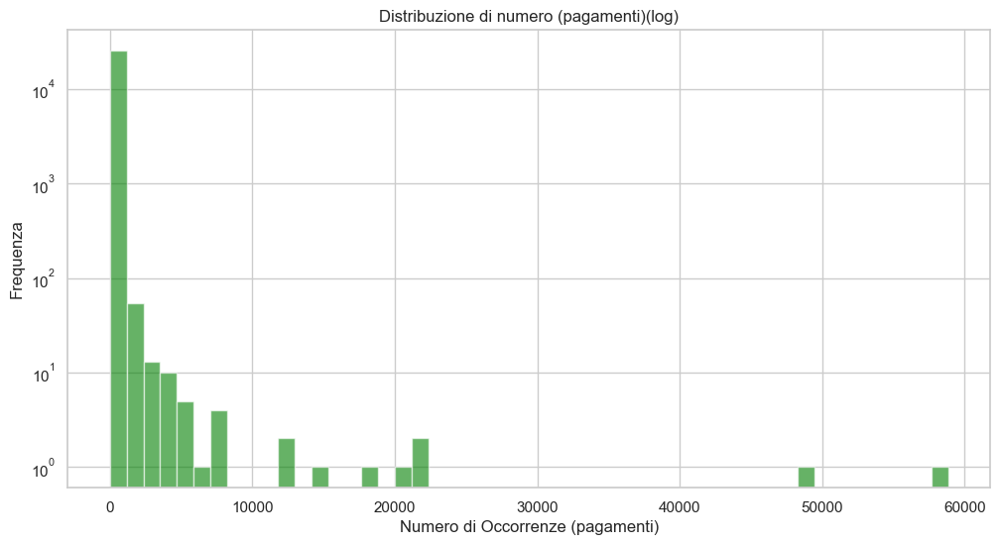

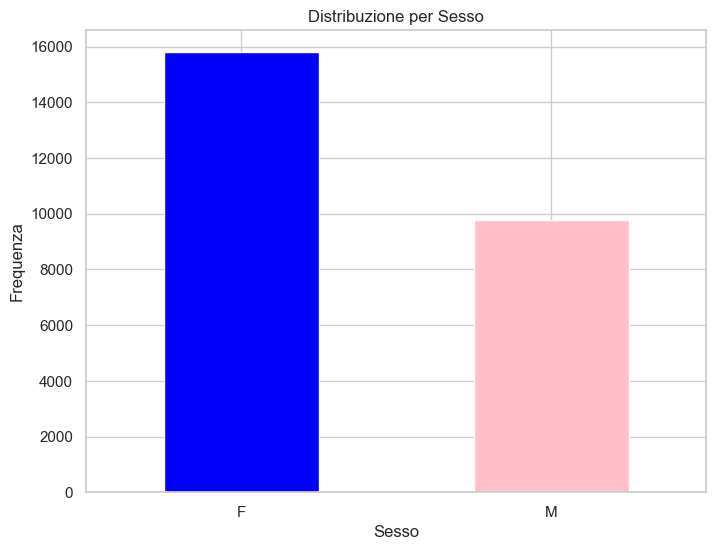

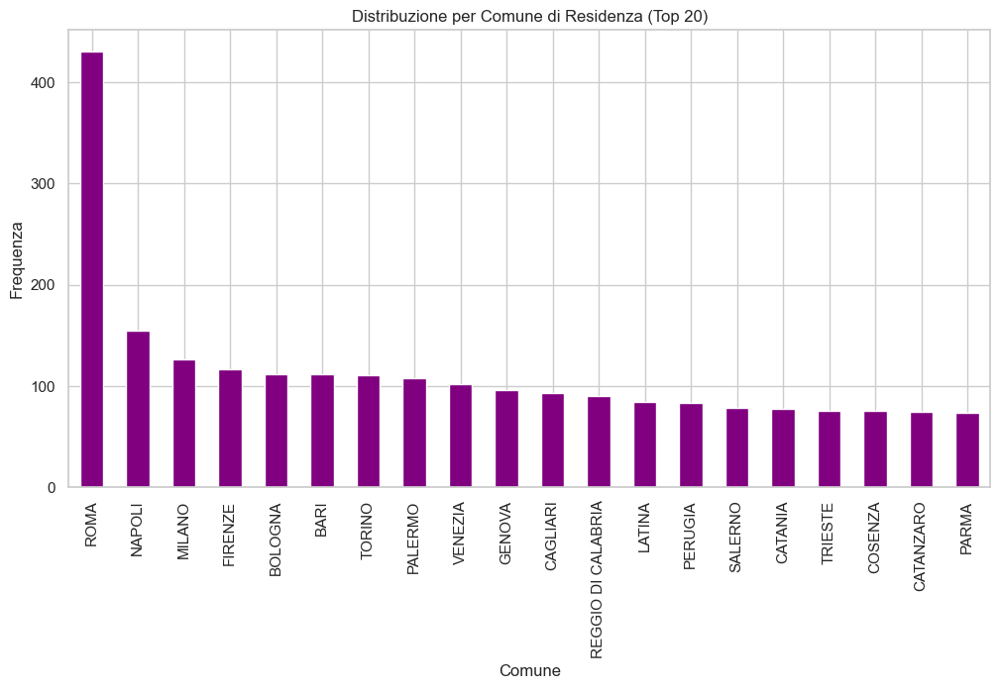

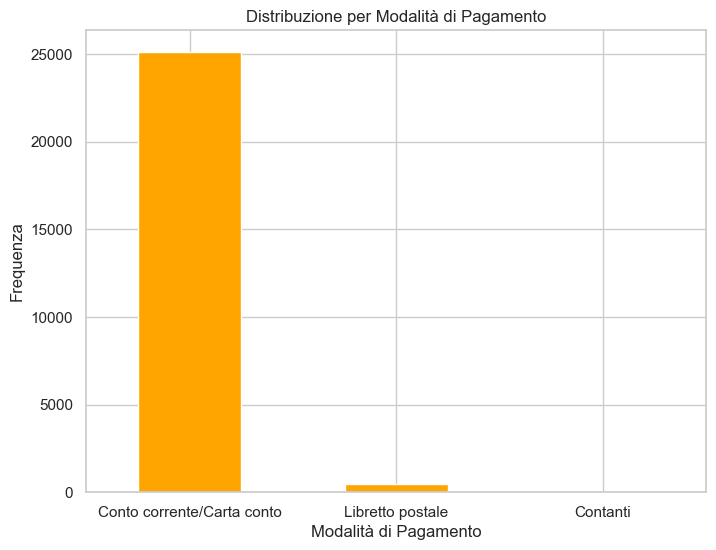

In [92]:

# Impostiamo uno stile per i grafici
sns.set_theme(style="whitegrid")

# 1. Visualizzazione della distribuzione di range_eta
plt.figure(figsize=(12, 6))
df_stip['range_eta'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribuzione per Range di Età (pagamenti)')
plt.xlabel('Range di Età (pagamenti)')
plt.ylabel('Frequenza')
plt.xticks(rotation=45)
plt.show()

# 2. Visualizzazione della distribuzione di numero
plt.figure(figsize=(12, 6))
plt.hist(df_stip['numero'], bins=50, alpha=0.6, color='green',log=False)
plt.title('Distribuzione di numero (pagamenti)')
plt.xlabel('Numero di Occorrenze (pagamenti)')
plt.ylabel('Frequenza')
plt.show()

# 2. Visualizzazione della distribuzione di numero
plt.figure(figsize=(12, 6))
plt.hist(df_stip['numero'], bins=50, alpha=0.6, color='green',log=True)
plt.title('Distribuzione di numero (pagamenti)(log)')
plt.xlabel('Numero di Occorrenze (pagamenti)')
plt.ylabel('Frequenza')
plt.show()

# 3. Distribuzione delle variabili categoriali
# 3a. Sesso
plt.figure(figsize=(8, 6))
df_stip['sesso'].value_counts().plot(kind='bar', color=['blue', 'pink'])
plt.title('Distribuzione per Sesso')
plt.xlabel('Sesso')
plt.ylabel('Frequenza')
plt.xticks(rotation=0)
plt.show()

# 3b. Comune di residenza
plt.figure(figsize=(12, 6))
df_stip['comune_della_sede'].value_counts().head(20).plot(kind='bar', color='purple')
plt.title('Distribuzione per Comune di Residenza (Top 20)')
plt.xlabel('Comune')
plt.ylabel('Frequenza')
plt.xticks(rotation=90)
plt.show()

# 3c. Modalità di pagamento
plt.figure(figsize=(8, 6))
df_stip['modalita_pagamento'].value_counts().plot(kind='bar', color='orange')
plt.title('Distribuzione per Modalità di Pagamento')
plt.xlabel('Modalità di Pagamento')
plt.ylabel('Frequenza')
plt.xticks(rotation=0)
plt.show()


In [95]:
#utenti per sesso e numero di pagamenti
sesso_pagamenti = df_stip.groupby('sesso')['numero'].sum()
sesso_pagamenti

sesso
F    1129714
M     688238
Name: numero, dtype: int64

In [36]:
eta_pagamenti = df_stip.groupby('range_eta')['numero'].sum()
eta_pagamenti

range_eta
18-24      38937
25-34     212444
35-44     360408
45-54     563834
55-64     588128
65-100     54201
Name: numero, dtype: int64

In [97]:
#utenti per sesso e regione e numero di pagamenti
sesso_regioni_pagamenti = df_stip.groupby(['sesso', 'comune_della_sede'])['numero'].sum().reset_index()
print(sesso_regioni_pagamenti.to_string())

     sesso                   comune_della_sede  numero
0        F                         ABANO TERME     346
1        F               ABBADIA SAN SALVATORE     127
2        F                           ABBASANTA       6
3        F                       ABBIATEGRASSO     671
4        F                               ACATE     114
5        F                             ACCADIA      90
6        F                              ACERRA    1137
7        F                        ACI CASTELLO     141
8        F                          ACI CATENA     336
9        F                    ACI SANT'ANTONIO     213
10       F                            ACIREALE    1231
11       F                          ACQUALAGNA      48
12       F                       ACQUAPENDENTE     168
13       F                             ACQUARO     164
14       F                         ACQUASPARTA      97
15       F               ACQUAVIVA DELLE FONTI     663
16       F                          ACQUEDOLCI      68
17       F

In [98]:
#utenti per sesso e amministrazione e numero di pagamenti
sesso_amministrazione_pagamenti = df_stip.groupby(['sesso', 'amministrazione'])['numero'].sum().reset_index()
print(sesso_amministrazione_pagamenti.to_string())

    sesso                                                                                             amministrazione  numero
0       F                                                                                 A.O. S. GIOVANNI ADDOLORATA     651
1       F                                                                                 A.O.R.N. ANTONIO CARDARELLI    1991
2       F                                                                                         AGENZIA DEL DEMANIO     597
3       F                                                                                        AGENZIA DELLE DOGANE    3567
4       F                                                                                       AGENZIA DELLE ENTRATE   15440
5       F                                                                                AGENZIA INDUSTRIE DIFESA AID      54
6       F                                                                         AGENZIA ITALIANA DEL FARMACO - AIFA 

In [99]:
#utenti per e amministrazione e numero di pagamenti
amministrazione_pagamenti = df_stip.groupby(['amministrazione'])['numero'].sum().reset_index()
print(amministrazione_pagamenti.to_string())

                                                                                               amministrazione   numero
0                                                                                  A.O. S. GIOVANNI ADDOLORATA      904
1                                                                                  A.O.R.N. ANTONIO CARDARELLI     3625
2                                                                                          AGENZIA DEL DEMANIO     1120
3                                                                                         AGENZIA DELLE DOGANE     8171
4                                                                                        AGENZIA DELLE ENTRATE    31480
5                                                                                 AGENZIA INDUSTRIE DIFESA AID      399
6                                                                          AGENZIA ITALIANA DEL FARMACO - AIFA      616
7                                       

In [ ]:
#drop range eta
df_stip.drop(columns=['range_eta'], inplace=True)
#salva
df_stip.to_csv('datasets/EntryAccreditoStipendi_202501_clean.csv', index=False)

# REDDITO 

In [143]:
df_redd = pd.read_csv('datasets/EntryAmministratiPerFasciaDiReddito_202501.csv')
df_redd.head()

,comparto,regione_residenza,sesso,eta_min,eta_max,aliquota_max,fascia_reddito_min,fascia_reddito_max,numerosita
0,ALTRO PERSONALE,ABRUZZO,F,65,,23,NaN,Fino a 28000,1
1,ALTRO PERSONALE,ABRUZZO,F,25,34,23,NaN,Fino a 28000,5
2,ALTRO PERSONALE,ABRUZZO,F,35,44,23,NaN,Fino a 28000,1
3,ALTRO PERSONALE,ABRUZZO,F,45,54,23,NaN,Fino a 28000,1
4,ALTRO PERSONALE,ABRUZZO,F,45,54,35,Oltre i 28000,Fino a 50000,2


In [127]:
df_redd.shape

(5099, 9)

In [101]:
#reddito 
print(df_redd.to_string())


                                                          comparto      regione_residenza sesso  eta_min eta_max  aliquota_max fascia_reddito_min fascia_reddito_max  numerosita
0                                                  ALTRO PERSONALE                ABRUZZO     F       65                    23                NaN       Fino a 28000           1
1                                                  ALTRO PERSONALE                ABRUZZO     F       25      34            23                NaN       Fino a 28000           5
2                                                  ALTRO PERSONALE                ABRUZZO     F       35      44            23                NaN       Fino a 28000           1
3                                                  ALTRO PERSONALE                ABRUZZO     F       45      54            23                NaN       Fino a 28000           1
4                                                  ALTRO PERSONALE                ABRUZZO     F       45      54   

In [128]:
#verifica la presenza di valori nulli e visualizza i tipi di dati
missing_values_redd = df_redd.isnull().sum()
data_types_redd = df_redd.dtypes
# Statistiche descrittive per le variabili numeriche
numerical_summary_redd = df_redd.describe()
# Statistiche descrittive per le variabili categoriali
categorical_summary_redd = df_redd.describe(include=['object'])
missing_values_redd, data_types_redd


(comparto                 0
 regione_residenza        0
 sesso                    0
 eta_min                  0
 eta_max                  0
 aliquota_max             0
 fascia_reddito_min    1628
 fascia_reddito_max    1723
 numerosita               0
 dtype: int64,
 comparto              object
 regione_residenza     object
 sesso                 object
 eta_min                int64
 eta_max               object
 aliquota_max           int64
 fascia_reddito_min    object
 fascia_reddito_max    object
 numerosita             int64
 dtype: object)

In [129]:
numerical_summary_redd

,eta_min,aliquota_max,numerosita
count,5099.000000,5099.000000,5099.000000
mean,44.505785,33.871936,377.161208
std,13.863048,8.145106,1754.198115
min,18.000000,23.000000,1.000000
25%,35.000000,23.000000,2.000000
50%,45.000000,35.000000,6.000000
75%,55.000000,43.000000,58.000000
max,65.000000,43.000000,28376.000000


In [130]:
categorical_summary_redd

,comparto,regione_residenza,sesso,eta_max,fascia_reddito_min,fascia_reddito_max
count,5099,5099,5099,5099,3471,3376
unique,22,21,2,6,2,2
top,COMPARTO FUNZIONI CENTRALI,LAZIO,M,64,Oltre i 28000,Fino a 50000
freq,594,515,2650,1184,1748,1748


In [28]:
# Creiamo una nuova colonna 'range_eta' che contiene il range di eta
df_redd['range_eta'] = df_redd.apply(lambda row: f"{row['eta_min']}-{row['eta_max']}", axis=1)


# Verifica la creazione della nuova colonna
df_redd[['eta_min', 'range_eta']].head()
# Verifica la presenza di valori nulli
print(df_redd.isnull().sum())
print(df_redd.head())

comparto                 0
regione_residenza        0
sesso                    0
eta_min                  0
eta_max                  0
aliquota_max             0
fascia_reddito_min    1628
fascia_reddito_max    1723
numerosita               0
range_eta                0
dtype: int64
          comparto regione_residenza sesso  eta_min eta_max  aliquota_max  \
0  ALTRO PERSONALE           ABRUZZO     F       65                    23   
1  ALTRO PERSONALE           ABRUZZO     F       25      34            23   
2  ALTRO PERSONALE           ABRUZZO     F       35      44            23   
3  ALTRO PERSONALE           ABRUZZO     F       45      54            23   
4  ALTRO PERSONALE           ABRUZZO     F       45      54            35   

  fascia_reddito_min fascia_reddito_max  numerosita range_eta  
0                NaN       Fino a 28000           1      65-   
1                NaN       Fino a 28000           5     25-34  
2                NaN       Fino a 28000           1     35-44 

In [153]:
#valori unici per ogni colonna
unique_values_redd = {col: df_redd[col].unique() for col in df_redd.columns}
# Convertiamo la tabella in un DataFrame per una visualizzazione migliore
unique_values_redd_df = pd.DataFrame({col: [', '.join(map(str, values))] for col, values in unique_values_redd.items()}).transpose()
# Mostriamo la tabella con i valori unici
print(unique_values_redd_df)

                                                                    0
comparto            ALTRO PERSONALE, AREA DIRIGENZIALE FUNZIONI LO...
regione_residenza   ABRUZZO, BASILICATA, CALABRIA, CAMPANIA, EMILI...
sesso                                                            F, M
eta_min                                        65, 25, 35, 45, 55, 18
eta_max                                       100, 34, 44, 54, 64, 24
aliquota_max                                               23, 35, 43
fascia_reddito_min                                    0, 28000, 50000
fascia_reddito_max                              28000.0, 50000.0, inf
numerosita          1, 5, 2, 3, 4, 6, 7, 28, 19, 8, 32, 33, 9, 30,...


In [ ]:
#fill na con 0 per reddito min 
df_redd['fascia_reddito_min'] = df_redd['fascia_reddito_min'].fillna(0)


In [146]:
#replace ' ' con 100 per eta max 
df_redd['eta_max'] = df_redd['eta_max'].replace(' ', 100)

In [150]:
import re

# Funzione per estrarre solo il numero da una stringa
def extract_number(text):
    if pd.isna(text):
        return None
    numbers = re.findall(r'\d+', str(text))
    if numbers:
        return int(numbers[-1])  # Prendo l'ultimo numero (es. per "Fino a 28000" prendo 28000)
    return None

# Applicare la funzione alle colonne 'fascia_reddito_min' e 'fascia_reddito_max' nel dataframe df_redd
df_redd['fascia_reddito_min'] = df_redd['fascia_reddito_min'].apply(extract_number)
df_redd['fascia_reddito_max'] = df_redd['fascia_reddito_max'].apply(extract_number)

# trasformazione della colonna 'fascia_reddito_min' in int
df_redd['fascia_reddito_min'] = df_redd['fascia_reddito_min'].astype(int)
# trasformazione della colonna 'fascia_reddito_max' in int
#df_redd['fascia_reddito_max'] = df_redd['fascia_reddito_max'].astype(int)


In [152]:
# fill na reddito max con inf 
df_redd['fascia_reddito_max'] = df_redd['fascia_reddito_max'].fillna(float('inf')) 

In [154]:
df_redd[['fascia_reddito_min', 'fascia_reddito_max']].head()


,fascia_reddito_min,fascia_reddito_max
0,0,28000.0
1,0,28000.0
2,0,28000.0
3,0,28000.0
4,28000,50000.0


In [155]:
# Remove fascia_reddito_min and fascia_reddito_max columns
#df_redd = df_redd.drop(['fascia_reddito_min', 'fascia_reddito_max','eta_min', 'eta_max'], axis=1)

# Verify the columns have been removed
print(df_redd.columns)

Index(['comparto', 'regione_residenza', 'sesso', 'eta_min', 'eta_max',
       'aliquota_max', 'fascia_reddito_min', 'fascia_reddito_max',
       'numerosita'],
      dtype='object')


In [165]:
# Creiamo una tabella con i valori unici per ogni colonna
unique_values_redd = {col: df_redd[col].unique() for col in df_redd.columns}
# Convertiamo la tabella in un DataFrame per una visualizzazione migliore
unique_values_redd_df = pd.DataFrame({col: [', '.join(map(str, values))] for col, values in unique_values_redd.items()}).transpose()
# Mostriamo la tabella con i valori unici
print(unique_values_redd_df)

                                                                    0
comparto            ALTRO PERSONALE, AREA DIRIGENZIALE FUNZIONI LO...
regione_residenza   ABRUZZO, BASILICATA, CALABRIA, CAMPANIA, EMILI...
sesso                                                            F, M
eta_min                                        65, 25, 35, 45, 55, 18
eta_max                                       100, 34, 44, 54, 64, 24
aliquota_max                                               23, 35, 43
fascia_reddito_min                                    0, 28000, 50000
fascia_reddito_max                              28000.0, 50000.0, inf
numerosita          1, 5, 2, 3, 4, 6, 7, 28, 19, 8, 32, 33, 9, 30,...


In [166]:
#check na 
print(df_redd.isnull().sum())

comparto              0
regione_residenza     0
sesso                 0
eta_min               0
eta_max               0
aliquota_max          0
fascia_reddito_min    0
fascia_reddito_max    0
numerosita            0
dtype: int64


In [160]:
#eta max in int 
df_redd['eta_max'] = df_redd['eta_max'].astype(int)

In [161]:
df_redd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5099 entries, 0 to 5098
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   comparto            5099 non-null   object 
 1   regione_residenza   5099 non-null   object 
 2   sesso               5099 non-null   object 
 3   eta_min             5099 non-null   int64  
 4   eta_max             5099 non-null   int64  
 5   aliquota_max        5099 non-null   int64  
 6   fascia_reddito_min  5099 non-null   int64  
 7   fascia_reddito_max  5099 non-null   float64
 8   numerosita          5099 non-null   int64  
dtypes: float64(1), int64(5), object(3)
memory usage: 358.6+ KB


In [163]:
# Statistiche descrittive per le variabili numeriche tipo number  
numerical_stats_redd = df_redd[['eta_min', 'eta_max', 'fascia_reddito_min', 'fascia_reddito_max','aliquota_max','numerosita']].describe().round(2)

# Frequenze per le variabili categoriali
categorical_stats_redd = df_redd[['sesso', 'regione_residenza', 'comparto']].describe()


numerical_stats_redd


/Users/leonardorisica/Desktop/MACHINE LEARNING/AGENTS/myenv/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


,eta_min,eta_max,fascia_reddito_min,fascia_reddito_max,aliquota_max,numerosita
count,5099.00,5099.00,5099.00,5099.0,5099.00,5099.00
mean,44.51,57.47,26494.21,inf,33.87,377.16
std,13.86,21.36,20289.79,NaN,8.15,1754.20
min,18.00,24.00,0.00,28000.0,23.00,1.00
25%,35.00,44.00,0.00,28000.0,23.00,2.00
50%,45.00,54.00,28000.00,50000.0,35.00,6.00
75%,55.00,64.00,50000.00,NaN,43.00,58.00
max,65.00,100.00,50000.00,inf,43.00,28376.00


In [164]:
categorical_stats_redd

,sesso,regione_residenza,comparto
count,5099,5099,5099
unique,2,21,22
top,M,LAZIO,COMPARTO FUNZIONI CENTRALI
freq,2650,515,594


In [171]:
#range reddito 
df_redd['range_reddito'] = df_redd.apply(lambda row: f"{row['fascia_reddito_min']}-{row['fascia_reddito_max']}", axis=1)
#range eta 
df_redd['range_eta'] = df_redd.apply(lambda row: f"{row['eta_min']}-{row['eta_max']}", axis=1)
# Verifica la creazione della nuova colonna
df_redd[['range_reddito', 'range_eta']].head(10)

,range_reddito,range_eta
0,0-28000.0,65-100
1,0-28000.0,25-34
2,0-28000.0,35-44
3,0-28000.0,45-54
4,28000-50000.0,45-54
5,50000-inf,45-54
6,0-28000.0,55-64
7,28000-50000.0,55-64
8,0-28000.0,65-100
9,28000-50000.0,18-24


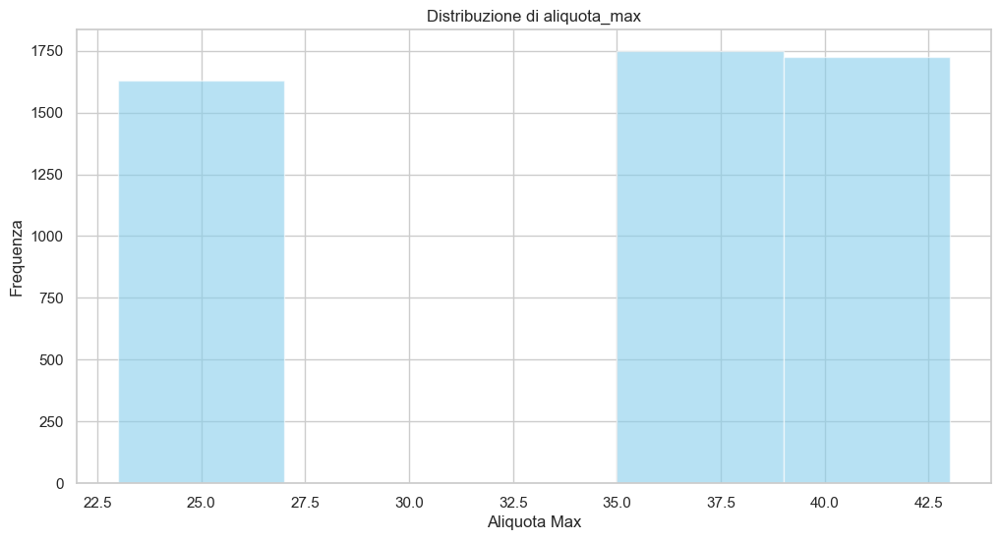

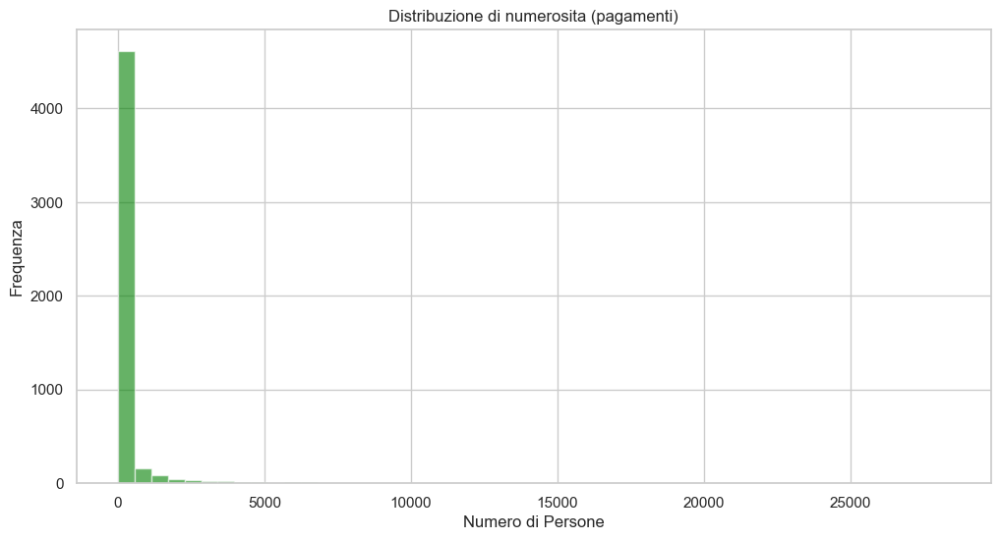

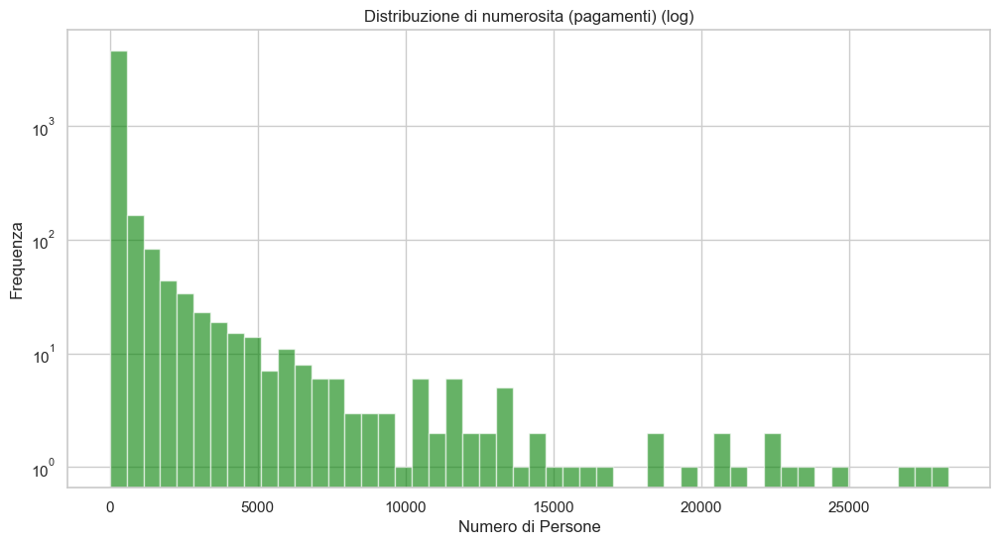

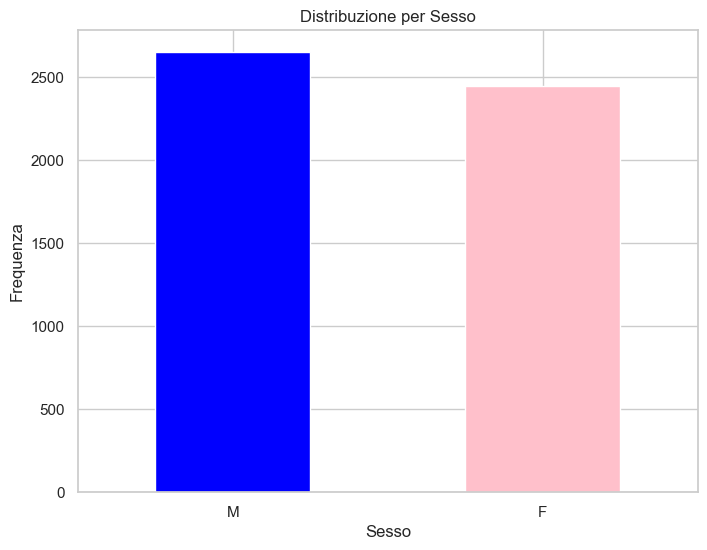

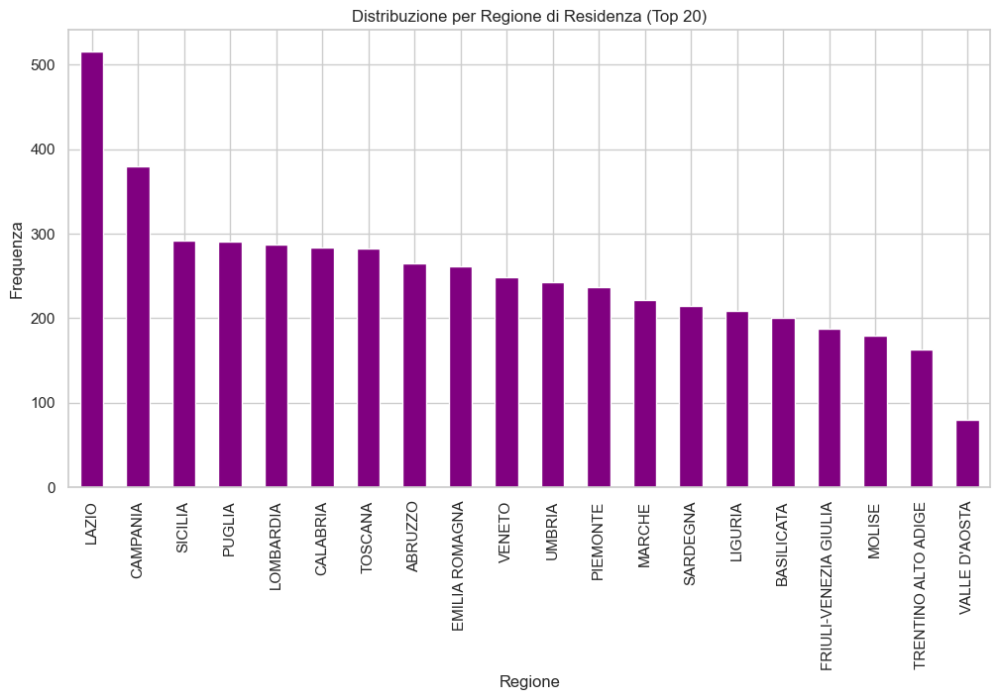

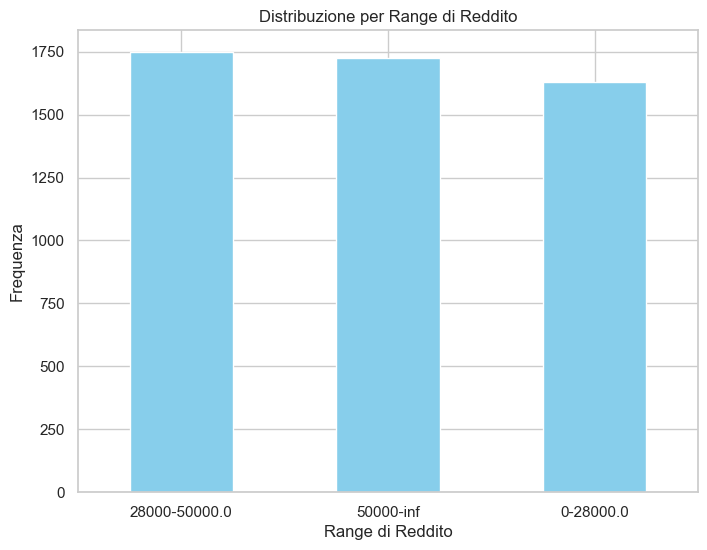

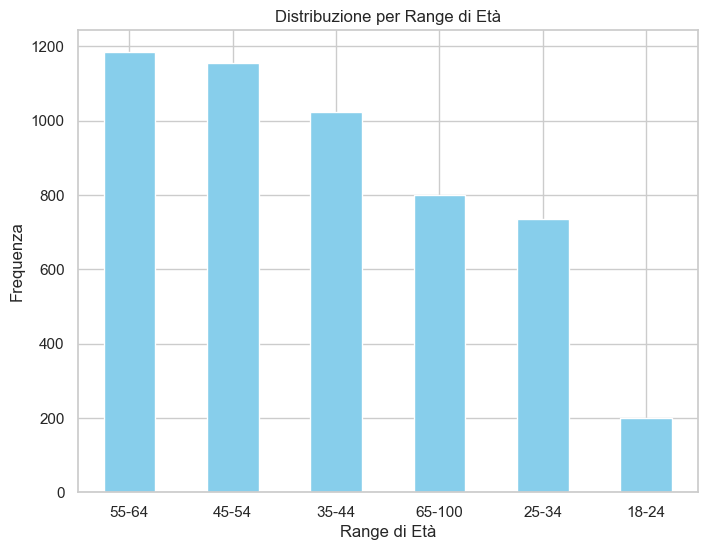

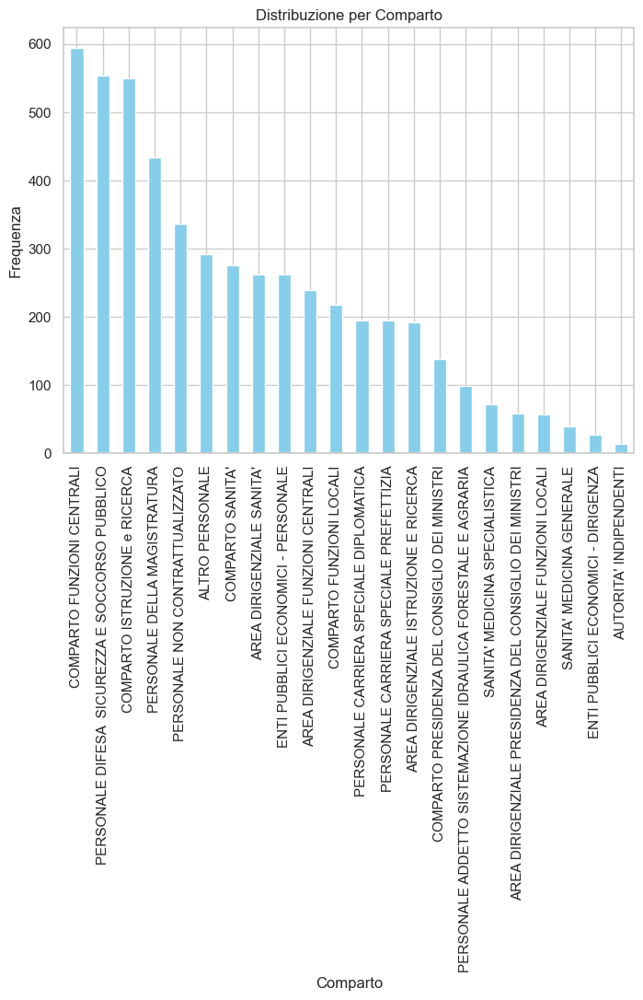

In [172]:


# Impostiamo uno stile per i grafici
sns.set_theme(style="whitegrid")

# Separiamo il primo grafico in due grafici distinti

# 1. Visualizzazione della distribuzione di aliquota_max
plt.figure(figsize=(12, 6))
plt.hist(df_redd['aliquota_max'], bins=5, alpha=0.6, color='skyblue')
plt.title('Distribuzione di aliquota_max')
plt.xlabel('Aliquota Max')
plt.ylabel('Frequenza')
plt.show()

# 2. Visualizzazione della distribuzione di numerosita
plt.figure(figsize=(12, 6))
plt.hist(df_redd['numerosita'], bins=50, alpha=0.6, color='green')
plt.title('Distribuzione di numerosita (pagamenti)')
plt.xlabel('Numero di Persone')
plt.ylabel('Frequenza')
plt.show()

# 2. Visualizzazione della distribuzione di numerosita (log)
plt.figure(figsize=(12, 6))
plt.hist(df_redd['numerosita'], bins=50, alpha=0.6, color='green', log=True)
plt.title('Distribuzione di numerosita (pagamenti) (log)')
plt.xlabel('Numero di Persone')
plt.ylabel('Frequenza')
plt.show()

# 2. Distribuzione delle variabili categoriali
# 2a. Sesso
plt.figure(figsize=(8, 6))
df_redd['sesso'].value_counts().plot(kind='bar', color=['blue', 'pink'])
plt.title('Distribuzione per Sesso')
plt.xlabel('Sesso')
plt.ylabel('Frequenza')
plt.xticks(rotation=0)
plt.show()

# 2b. Comune di residenza
plt.figure(figsize=(12, 6))
df_redd['regione_residenza'].value_counts().head(20).plot(kind='bar', color='purple')
plt.title('Distribuzione per Regione di Residenza (Top 20)')
plt.xlabel('Regione')
plt.ylabel('Frequenza')
plt.xticks(rotation=90)
plt.show()

# 2c. Range di reddito
plt.figure(figsize=(8, 6))
df_redd['range_reddito'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribuzione per Range di Reddito')
plt.xlabel('Range di Reddito')
plt.ylabel('Frequenza')
plt.xticks(rotation=0)
plt.show()

# 2d. Range di età
plt.figure(figsize=(8, 6))
df_redd['range_eta'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribuzione per Range di Età')
plt.xlabel('Range di Età')
plt.ylabel('Frequenza')
plt.xticks(rotation=0)
plt.show()

# 2e. Comparto
plt.figure(figsize=(8, 6))             
df_redd['comparto'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribuzione per Comparto')
plt.xlabel('Comparto')
plt.ylabel('Frequenza')
plt.xticks(rotation=90)
plt.show()


In [174]:
#numero utenti per sesso e range eta 
sesso_range_eta = df_redd.groupby(['sesso', 'range_eta'])['numerosita'].sum().reset_index()
print(sesso_range_eta.to_string())

   sesso range_eta  numerosita
0      F     18-24        9271
1      F     25-34      114689
2      F     35-44      211138
3      F     45-54      350533
4      F     55-64      421666
5      F    65-100       77417
6      M     18-24       23520
7      M     25-34       96366
8      M     35-44      152396
9      M     45-54      222809
10     M     55-64      208828
11     M    65-100       34512


In [176]:
#numero utenti per sesso e range reddito
sesso_range_reddito = df_redd.groupby(['sesso', 'range_reddito'])['numerosita'].sum().reset_index()
print(sesso_range_reddito.to_string())

  sesso  range_reddito  numerosita
0     F      0-28000.0      751002
1     F  28000-50000.0      412416
2     F      50000-inf       21296
3     M      0-28000.0      335215
4     M  28000-50000.0      370150
5     M      50000-inf       33066


In [177]:
#numero utenti per sesso e range reddito e range eta 
sesso_range_reddito_eta = df_redd.groupby(['sesso', 'range_reddito', 'range_eta'])['numerosita'].sum().reset_index()
print(sesso_range_reddito_eta.to_string())

   sesso  range_reddito range_eta  numerosita
0      F      0-28000.0     18-24        8826
1      F      0-28000.0     25-34      101752
2      F      0-28000.0     35-44      182813
3      F      0-28000.0     45-54      235092
4      F      0-28000.0     55-64      188966
5      F      0-28000.0    65-100       33553
6      F  28000-50000.0     18-24         445
7      F  28000-50000.0     25-34       12383
8      F  28000-50000.0     35-44       24588
9      F  28000-50000.0     45-54      109206
10     F  28000-50000.0     55-64      223664
11     F  28000-50000.0    65-100       42130
12     F      50000-inf     25-34         554
13     F      50000-inf     35-44        3737
14     F      50000-inf     45-54        6235
15     F      50000-inf     55-64        9036
16     F      50000-inf    65-100        1734
17     M      0-28000.0     18-24       21935
18     M      0-28000.0     25-34       79475
19     M      0-28000.0     35-44       84593
20     M      0-28000.0     45-54 

In [178]:
# Calcoliamo la somma del numero di occorrenze per ogni sesso e per ogni regione
sesso_regioni_occorrenze_somma = df_acc.groupby(['sesso', 'regione_residenza_domicilio'])['numero_occorrenze'].sum().reset_index()
print(sesso_regioni_occorrenze_somma.to_string())

   sesso regione_residenza_domicilio  numero_occorrenze
0      F                     ABRUZZO              23041
1      F                  BASILICATA              10540
2      F                    CALABRIA              43993
3      F                    CAMPANIA             121980
4      F              EMILIA ROMAGNA              47835
5      F                      ESTERO                 79
6      F       FRIULI-VENEZIA GIULIA              14822
7      F                       LAZIO             117834
8      F                     LIGURIA              18216
9      F                   LOMBARDIA              96914
10     F                      MARCHE              21185
11     F                      MOLISE               5831
12     F                    PIEMONTE              49605
13     F                      PUGLIA              65983
14     F                    SARDEGNA              28018
15     F                     SICILIA              95840
16     F                     TOSCANA            

In [179]:
#drop range eta e reddito
df_redd.drop(columns=['range_eta', 'range_reddito'], inplace=True)
#salva
df_redd.to_csv('datasets/EntryAmministratiPerFasciaDiReddito_202501_clean.csv', index=False)

# PENDOLARISMO 

In [10]:
df_pend = pd.read_csv('datasets/EntryPendolarismo_202501.csv')


In [3]:
df_pend.shape

(24842, 7)

In [181]:
print(df_pend.to_string())

        provincia_della_sede                   comune_della_sede stesso_comune                                                                                                        ente  numero_amministrati distance_min_KM distance_max_KM
0                    CATANIA                            ACIREALE            NO                                                CONSIGLIO PER RIC. IN AGRICOLTURA E ANALISI ECONOMIA AGRARIA                   11               5              10
1                    VITERBO                       ACQUAPENDENTE            NO                                                                      MINISTERO DELL'ISTRUZIONE E DEL MERITO                    8             200             600
2                    VITERBO                       ACQUAPENDENTE            NO                                                                      MINISTERO DELL'ISTRUZIONE E DEL MERITO                   17              50             100
3                     NAPOLI            

In [4]:
#valori nulli e tipi di dati
missing_values_pend = df_pend.isnull().sum()
data_types_pend = df_pend.dtypes
# Statistiche descrittive per le variabili numeriche
numerical_summary_pend = df_pend.describe()
# Statistiche descrittive per le variabili categoriali
categorical_summary_pend = df_pend.describe(include=['object'])
missing_values_pend, data_types_pend, 


(provincia_della_sede    0
 comune_della_sede       0
 stesso_comune           0
 ente                    0
 numero_amministrati     0
 distance_min_KM         0
 distance_max_KM         0
 dtype: int64,
 provincia_della_sede    object
 comune_della_sede       object
 stesso_comune           object
 ente                    object
 numero_amministrati      int64
 distance_min_KM         object
 distance_max_KM         object
 dtype: object)

In [184]:
numerical_summary_pend

,numero_amministrati
count,24842.000000
mean,81.252999
std,761.856806
min,6.000000
25%,13.000000
50%,27.000000
75%,57.000000
max,90451.000000


In [185]:
categorical_summary_pend

,provincia_della_sede,comune_della_sede,stesso_comune,ente,distance_min_KM,distance_max_KM
count,24842,24842,24842,24842,24842,24842
unique,108,3026,2,75,8,8
top,ROMA,ROMA,NO,MINISTERO DELL'ISTRUZIONE E DEL MERITO,,5
freq,972,410,18966,18073,6045,6045


In [8]:
# Creiamo una tabella con i valori unici per ogni colonna       
unique_values_pend = {col: df_pend[col].unique() for col in df_pend.columns}
# Convertiamo la tabella in un DataFrame per una visualizzazione migliore
unique_values_pend_df = pd.DataFrame({col: [', '.join(map(str, values))] for col, values in unique_values_pend.items()}).transpose()
# Mostriamo la tabella con i valori unici
print(unique_values_pend_df)



                                                                      0
provincia_della_sede  CATANIA, VITERBO, NAPOLI, PESCARA, ALESSANDRIA...
comune_della_sede     ACIREALE, ACQUAPENDENTE, AFRAGOLA, ALANNO, ALE...
stesso_comune                                                    NO, SI
ente                  CONSIGLIO PER RIC. IN AGRICOLTURA E ANALISI EC...
numero_amministrati   11, 8, 17, 371, 27, 6, 53, 13, 7, 59, 37, 18, ...
distance_min_KM                         5, 200, 50, 20, 100, 10, 0, 600
distance_max_KM                       10, 600, 100, 50, 200, 20, 5, inf


In [6]:
#replace ' ' con 0

#replace ' ' con 100 per eta max 
df_pend['distance_min_KM'] = df_pend['distance_min_KM'].replace(' ', 0)

In [7]:
df_pend['distance_max_KM'] = df_pend['distance_max_KM'].replace(' ', float('inf'))

In [17]:
# Salva il DataFrame df_pend in un file CSV
df_pend.to_csv('datasets/EntryPendolarismo_202501_clean.csv', index=False)

In [18]:
# Creiamo una nuova colonna 'range_KM' che contiene il range di KM
df_pend['range_KM'] = df_pend.apply(lambda row: f"{row['distance_min_KM']}-{row['distance_max_KM']}", axis=1)
# Verifica la creazione della nuova colonna
df_pend[['distance_max_KM', 'range_KM']].head()
# Verifica la presenza di valori nulli
print(df_pend.isnull().sum())
print(df_pend.head())


provincia_della_sede    0
comune_della_sede       0
stesso_comune           0
ente                    0
numero_amministrati     0
distance_min_KM         0
distance_max_KM         0
range_KM                0
dtype: int64
  provincia_della_sede comune_della_sede stesso_comune  \
0              CATANIA          ACIREALE            NO   
1              VITERBO     ACQUAPENDENTE            NO   
2              VITERBO     ACQUAPENDENTE            NO   
3               NAPOLI          AFRAGOLA            NO   
4              PESCARA            ALANNO            NO   

                                                ente  numero_amministrati  \
0  CONSIGLIO PER RIC. IN AGRICOLTURA E ANALISI EC...                   11   
1             MINISTERO DELL'ISTRUZIONE E DEL MERITO                    8   
2             MINISTERO DELL'ISTRUZIONE E DEL MERITO                   17   
3             MINISTERO DELL'ISTRUZIONE E DEL MERITO                  371   
4             MINISTERO DELL'ISTRUZIONE E DEL

In [19]:
# Assicurati che i valori siano numerici (dopo aver sostituito gli spazi)
df_pend['distance_min_KM'] = pd.to_numeric(df_pend['distance_min_KM'], errors='coerce').fillna(0).astype(int)
df_pend['distance_max_KM'] = pd.to_numeric(df_pend['distance_max_KM'], errors='coerce').fillna(0).astype(float)

In [20]:
df_pend.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24842 entries, 0 to 24841
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   provincia_della_sede  24842 non-null  object 
 1   comune_della_sede     24842 non-null  object 
 2   stesso_comune         24842 non-null  object 
 3   ente                  24842 non-null  object 
 4   numero_amministrati   24842 non-null  int64  
 5   distance_min_KM       24842 non-null  int64  
 6   distance_max_KM       24842 non-null  float64
 7   range_KM              24842 non-null  object 
dtypes: float64(1), int64(2), object(5)
memory usage: 1.5+ MB


In [21]:
#statistiche descrittive per le variabili numeriche
numerical_stats_pend = df_pend[['distance_min_KM', 'distance_max_KM', 'numero_amministrati']].describe().round(2)
# Frequenze per le variabili categoriali
categorical_stats_pend = df_pend[['provincia_della_sede','comune_della_sede', 'stesso_comune','ente','range_KM']].describe().round(2)
numerical_stats_pend

,distance_min_KM,distance_max_KM,numero_amministrati
count,24842.00,24842.0,24842.00
mean,75.43,inf,81.25
std,167.68,NaN,761.86
min,0.00,5.0,6.00
25%,5.00,10.0,13.00
50%,10.00,20.0,27.00
75%,50.00,100.0,57.00
max,600.00,inf,90451.00


In [22]:
categorical_stats_pend

,provincia_della_sede,comune_della_sede,stesso_comune,ente,range_KM
count,24842,24842,24842,24842,24842
unique,108,3026,2,75,8
top,ROMA,ROMA,NO,MINISTERO DELL'ISTRUZIONE E DEL MERITO,0-5.0
freq,972,410,18966,18073,6045


In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

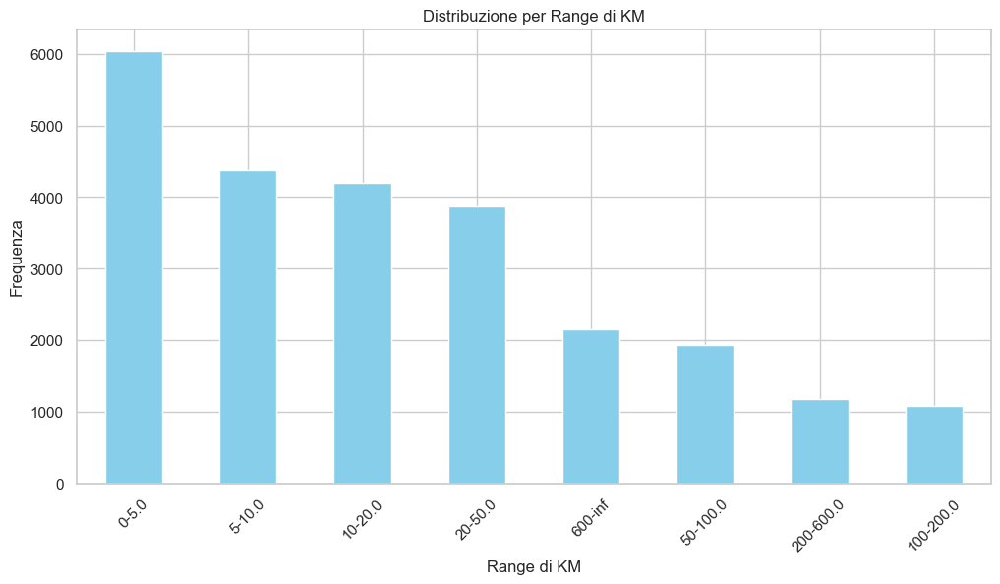

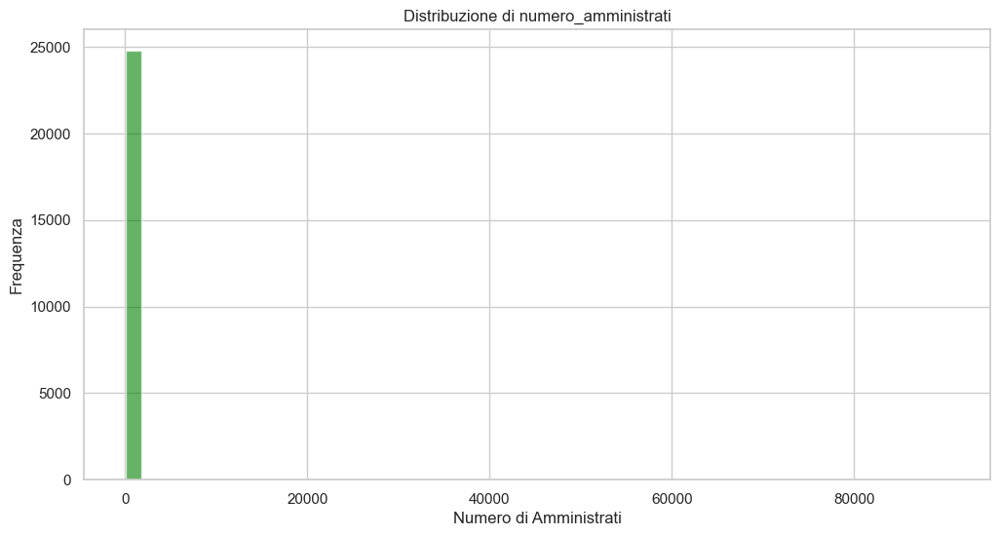

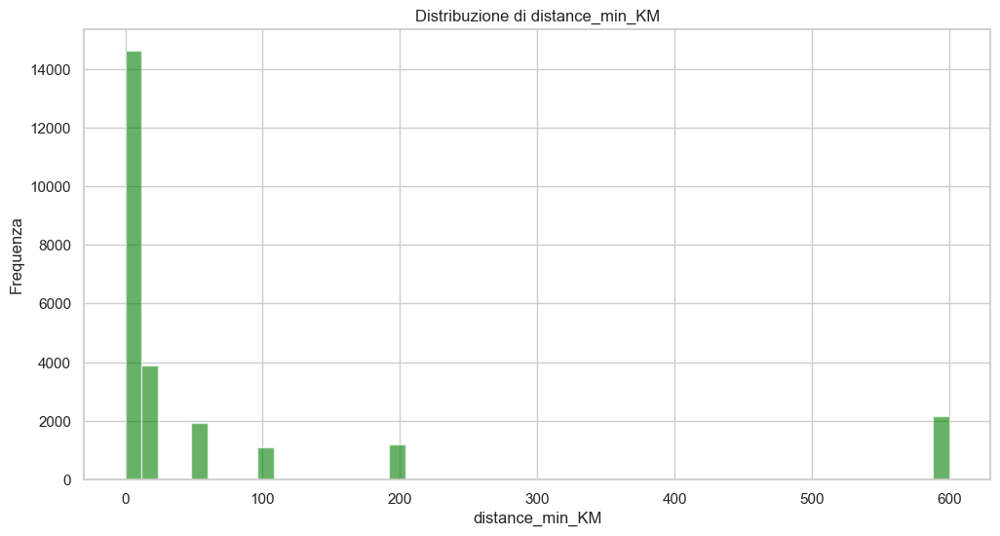

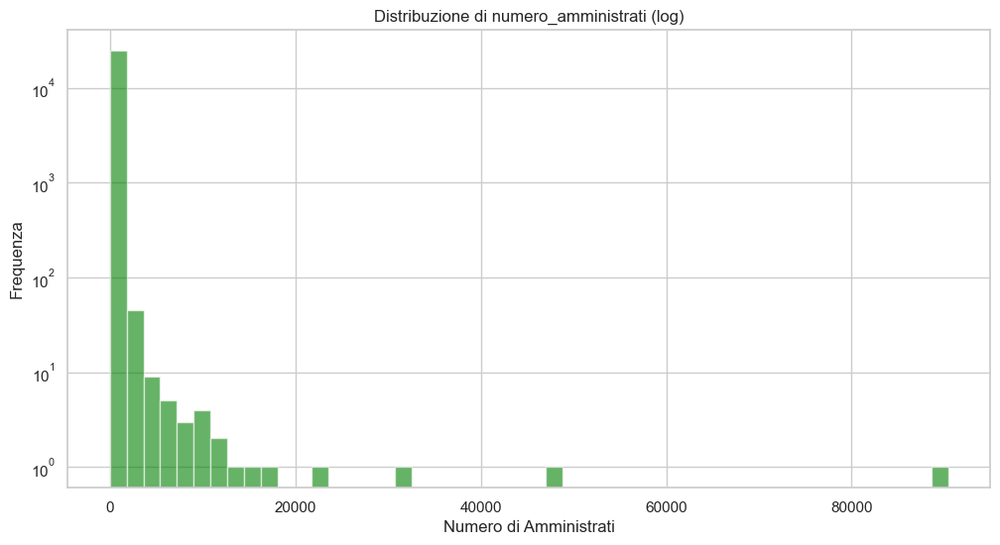

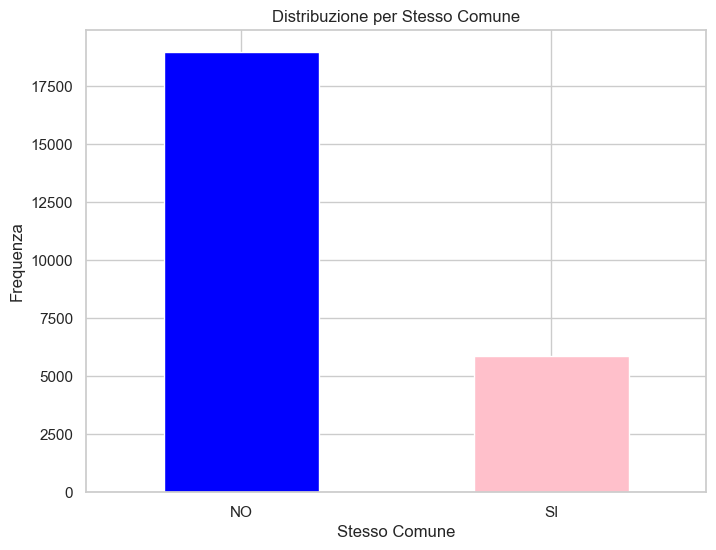

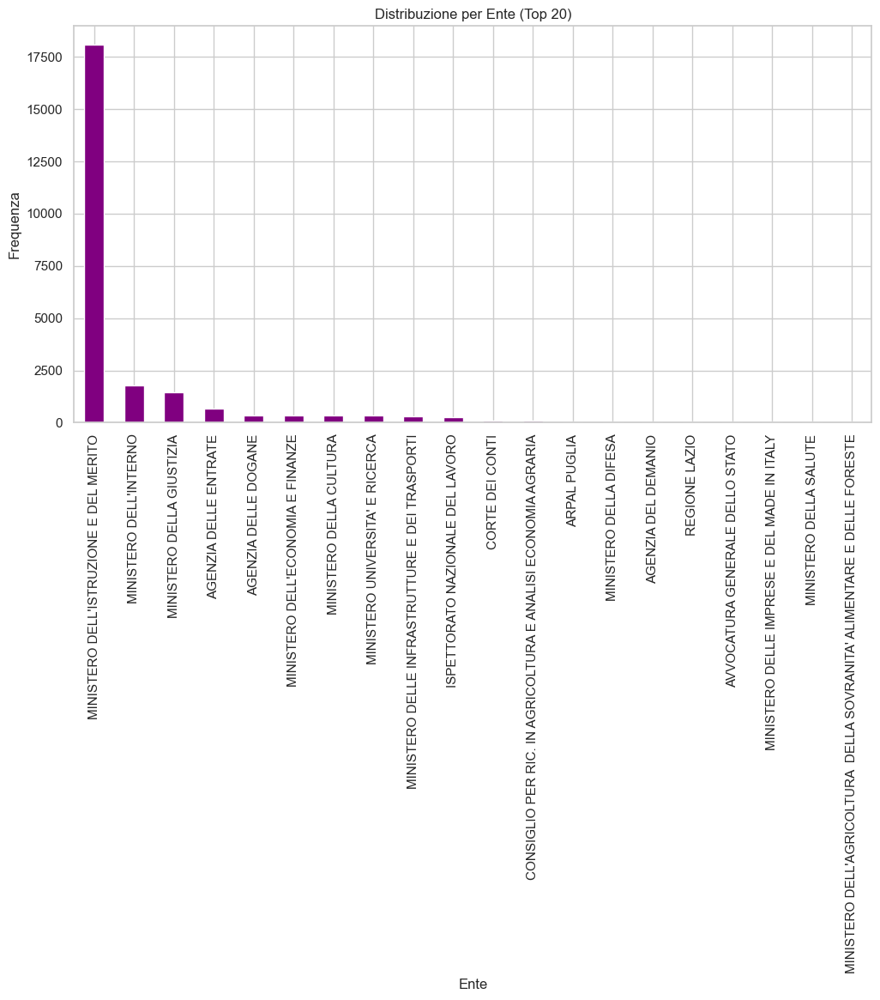

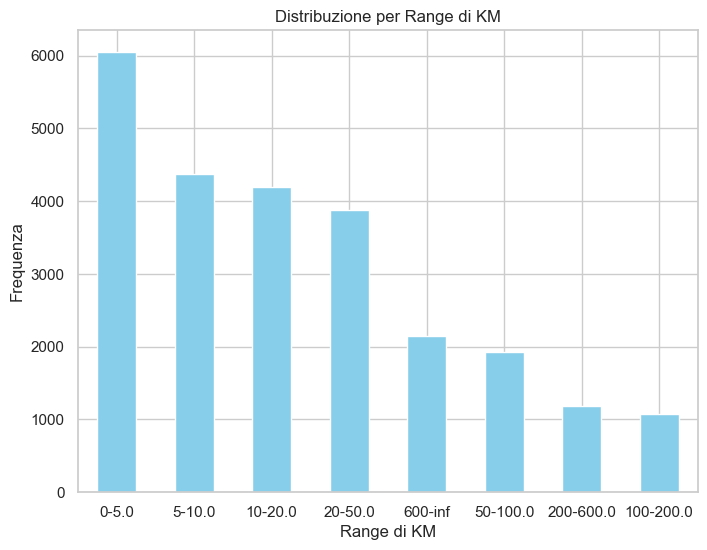

In [25]:
#impostiamo uno stile per i grafici
sns.set_theme(style="whitegrid")
# 1. Visualizzazione della distribuzione di range_KM
plt.figure(figsize=(12, 6))
df_pend['range_KM'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribuzione per Range di KM')              
plt.xlabel('Range di KM')
plt.ylabel('Frequenza')
plt.xticks(rotation=45)
plt.show()
# 2. Visualizzazione della distribuzione di numero_amministrati
plt.figure(figsize=(12, 6))
plt.hist(df_pend['numero_amministrati'], bins=50, alpha=0.6, color='green')
plt.title('Distribuzione di numero_amministrati')
plt.xlabel('Numero di Amministrati')    
plt.ylabel('Frequenza')
plt.show()
# 2. Visualizzazione della distribuzione di distance_min_KM
plt.figure(figsize=(12, 6))
plt.hist(df_pend['distance_min_KM'], bins=50, alpha=0.6, color='green')
plt.title('Distribuzione di distance_min_KM')
plt.xlabel('distance_min_KM')    
plt.ylabel('Frequenza')
plt.show()
# 2. Visualizzazione della distribuzione di numero_amministrati (log)
plt.figure(figsize=(12, 6))
plt.hist(df_pend['numero_amministrati'], bins=50, alpha=0.6, color='green', log=True)
plt.title('Distribuzione di numero_amministrati (log)')
plt.xlabel('Numero di Amministrati')
plt.ylabel('Frequenza')
plt.show()
# 3. Distribuzione delle variabili categoriali
# 3a. Stesso comune
plt.figure(figsize=(8, 6))
df_pend['stesso_comune'].value_counts().plot(kind='bar', color=['blue', 'pink'])
plt.title('Distribuzione per Stesso Comune')
plt.xlabel('Stesso Comune')
plt.ylabel('Frequenza')
plt.xticks(rotation=0)
plt.show()
# 3b. Ente
plt.figure(figsize=(12, 6))
df_pend['ente'].value_counts().head(20).plot(kind='bar', color='purple')
plt.title('Distribuzione per Ente (Top 20)')
plt.xlabel('Ente')
plt.ylabel('Frequenza')
plt.xticks(rotation=90)
plt.show()
# 3c. Range di KM
plt.figure(figsize=(8, 6))
df_pend['range_KM'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribuzione per Range di KM')
plt.xlabel('Range di KM')
plt.ylabel('Frequenza')
plt.xticks(rotation=0)
plt.show()


In [26]:
# Group by singolo su 'provincia_della_sede'
provincia_sum = df_pend.groupby('provincia_della_sede')['numero_amministrati'].sum()

# Group by singolo su 'comune_della_sede'
comune_sum = df_pend.groupby('comune_della_sede')['numero_amministrati'].sum()

# Group by singolo su 'ente'
ente_sum = df_pend.groupby('ente')['numero_amministrati'].sum()

# Group by combinato su 'provincia_della_sede' e 'ente'
provincia_ente_sum = df_pend.groupby(['provincia_della_sede', 'ente'])['numero_amministrati'].sum()

# Group by combinato su 'comune_della_sede' e 'range_KM'
comune_range_sum = df_pend.groupby(['comune_della_sede', 'range_KM'])['numero_amministrati'].sum()

# Visualizza i primi risultati
print(provincia_sum.head())



provincia_della_sede
AGRIGENTO      13332
ALESSANDRIA    10840
ANCONA         15351
AOSTA            734
AREZZO          8861
Name: numero_amministrati, dtype: int64


In [27]:
print(comune_sum.head())


comune_della_sede
ABANO TERME              535
ABBADIA SAN SALVATORE    193
ABBASANTA                225
ABBIATEGRASSO            907
ACATE                    155
Name: numero_amministrati, dtype: int64


In [28]:
print(ente_sum.head())


ente
AGENZIA DEL DEMANIO                     1146
AGENZIA DELLE DOGANE                   10278
AGENZIA DELLE ENTRATE                  33887
AGENZIA INDUSTRIE DIFESA AID             426
AGENZIA ITALIANA DEL FARMACO - AIFA      709
Name: numero_amministrati, dtype: int64


In [29]:
print(provincia_ente_sum.head())


provincia_della_sede  ente                                  
AGRIGENTO             AGENZIA DELLE DOGANE                         34
                      AGENZIA DELLE ENTRATE                       215
                      MINISTERO DELL'ECONOMIA E FINANZE            57
                      MINISTERO DELL'INTERNO                     1085
                      MINISTERO DELL'ISTRUZIONE E DEL MERITO    11081
Name: numero_amministrati, dtype: int64


In [30]:
print(comune_range_sum.head())

comune_della_sede  range_KM 
ABANO TERME        0-5.0        160
                   10-20.0      151
                   20-50.0       37
                   200-600.0     13
                   5-10.0       122
Name: numero_amministrati, dtype: int64
